<a href="https://colab.research.google.com/github/LeonimerMelo/GANs/blob/main/CIFAR10_GAN_full_v7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generative Adversarial Network (GAN) for Image Generation

## Overview
This script implements a deep learning GAN to generate synthetic images using the CIFAR-10 dataset. The implementation uses TensorFlow and follows these main steps:
1. Data Preparation
2. Generator and Discriminator Architecture
3. Training Process
4. Image Generation and Visualization

## Key Components

### Hyperparameters
- Latent Dimension: 100 (size of the random noise vector)
- Batch Size: 64
- Epochs: 50
- Learning Rate: 0.0002
- Beta_1 (Adam optimizer): 0.5

### Data Preprocessing
- Loads CIFAR-10 dataset
- Normalizes images to range [-1, 1]
- Ensures dataset size is a multiple of batch size

### Generator Architecture
- Takes a random noise vector as input
- Uses transposed convolutions to upsample and generate images
- Produces 32x32x3 images (CIFAR-10 image size)
- Uses BatchNormalization and LeakyReLU activations
- Final layer uses tanh activation to output images in [-1, 1] range

### Discriminator Architecture
- Convolutional neural network for binary classification
- Inputs 32x32x3 images
- Uses LeakyReLU and Dropout for regularization
- Outputs binary probability of image being real or fake

### Training Process
- Alternating training of generator and discriminator
- Uses binary cross-entropy loss
- Adam optimizer for both networks
- Tracks and plots generator and discriminator losses

### Key Training Functions
- `treino_discriminador`: Trains discriminator on real and fake images
- `treino_gerador`: Trains generator to fool the discriminator
- `treinar_gan`: Main training loop managing epoch-level training

### Visualization
- Generates sample images every 5 epochs
- Plots loss curves for generator and discriminator
- Saves generated images and loss plot

In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import random

In [2]:
# Carregar o banco de dados
def carregar_dataset():
  # Carregar imagens do CIFAR10
  (x_train, _), (_, _) = tf.keras.datasets.cifar10.load_data()

  # Normalizar imagens para o intervalo [-1, 1]
  x_train = x_train.astype('float32')
  x_train = (x_train - 127.5) / 127.5

  # Garantir que o número de amostras seja múltiplo do batch_size
  num_amostras = (len(x_train) // BATCH_SIZE) * BATCH_SIZE
  x_train = x_train[:num_amostras]

  return x_train

In [3]:
# Construção do Gerador
def criar_gerador():
  modelo = tf.keras.Sequential([
    tf.keras.Input(shape=(LATENT_DIM,)),
    tf.keras.layers.Dense(8*8*256),
    tf.keras.layers.Reshape((8, 8, 256)),

    # Camada de convolução transposta 2D (Conv2DTranspose)
    # A necessidade de convoluções transpostas geralmente surge do desejo de usar uma transformação indo na
    # direção oposta de uma convolução normal, ou seja, de algo que tem o formato da saída de alguma convolução
    # para algo que tem o formato de sua entrada, mantendo um padrão de conectividade que seja compatível com a dita convolução.

    tf.keras.layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(negative_slope=0.2),

    tf.keras.layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.LeakyReLU(negative_slope=0.2),

    tf.keras.layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', activation='tanh')
  ])
  return modelo

In [4]:
# Construção do Discriminador
def criar_discriminador():
  modelo = tf.keras.Sequential([
    tf.keras.Input(shape=(32, 32, 3)),

    tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(negative_slope=0.2),
    tf.keras.layers.Dropout(0.3),

    tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(negative_slope=0.2),
    tf.keras.layers.Dropout(0.3),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1, activation='sigmoid')
  ])
  return modelo

In [5]:
# Função de treinamento com @tf.function para melhoria de desempenho
@tf.function
def treino_discriminador(imagens_reais, gerador, discriminador, ruido):
  # Gerar imagens falsas
  imagens_falsas = gerador(ruido, training=True)

  # Preparar labels
  labels_reais = tf.ones((tf.shape(imagens_reais)[0], 1))
  labels_falsos = tf.zeros((tf.shape(imagens_falsas)[0], 1))

  # Concatenar imagens reais e falsas
  imagens_combinadas = tf.concat([imagens_reais, imagens_falsas], axis=0)
  labels_combinados = tf.concat([labels_reais, labels_falsos], axis=0)

  # Treinar discriminador
  with tf.GradientTape() as tape:
      preditos = discriminador(imagens_combinadas, training=True)
      perda_discriminador = tf.keras.losses.binary_crossentropy(labels_combinados, preditos)

  # Calcular e aplicar gradientes
  gradientes = tape.gradient(perda_discriminador, discriminador.trainable_variables)
  return perda_discriminador, gradientes

In [6]:
@tf.function
def treino_gerador(gerador, discriminador, ruido):
  # Preparar labels
  labels_enganosos = tf.ones((tf.shape(ruido)[0], 1))

  # Treinar gerador
  # A função tf.GradientTape() do TensorFlow é usada para gravar as operações executadas durante o
  # forward pass (propagação direta), de forma que depois seja possível calcular automaticamente os
  # gradientes dessas operações em relação a variáveis (geralmente pesos de um modelo).
  with tf.GradientTape() as tape:
      # Gerar imagens
      imagens_falsas = gerador(ruido, training=True)

      # Discriminador avalia imagens falsas
      preditos = discriminador(imagens_falsas, training=False)

      # Calcular perda do gerador
      perda_gerador = tf.keras.losses.binary_crossentropy(labels_enganosos, preditos)

  # Calcular e aplicar gradientes
  gradientes = tape.gradient(perda_gerador, gerador.trainable_variables)
  return perda_gerador, gradientes

In [7]:
# Função para geração e salvamento de imagens
def gerar_e_salvar_imagens(gerador, epoch):
    # Gerar imagens
    ruido = tf.random.normal([25, LATENT_DIM])
    imagens_geradas = gerador.predict(ruido)
    # Desnormalizar imagens
    imagens_geradas = 0.5 * imagens_geradas + 0.5
    # Plotar imagens
    plt.figure(figsize=(6, 6))
    for i in range(25):
        plt.subplot(5, 5, i+1)
        plt.imshow(imagens_geradas[i])
        plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'imagens_geradas_epoch_{epoch+1}.png')
    plt.show()
    plt.close()

In [8]:
# Visualização das perdas
def plotar_perdas(perdas_discriminador, perdas_gerador):
    # plt.figure(figsize=(10, 5))
    plt.plot(perdas_discriminador, label='Perda Discriminador')
    plt.plot(perdas_gerador, label='Perda Gerador')
    plt.title('Evolução das Perdas durante Treinamento')
    plt.xlabel('Épocas')
    plt.ylabel('Valor da Perda')
    plt.legend()
    plt.tight_layout()
    plt.savefig('curva_de_perdas.png')
    plt.show()
    plt.close()

In [9]:
def treinar_gan(gerador, discriminador, dados_reais):
    # Otimizadores
    otimizador_gerador = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1)
    otimizador_discriminador = tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE, beta_1=BETA_1)

    # Listas para armazenar perdas
    perdas_discriminador = []
    perdas_gerador = []

    # Preparar dataset
    dataset = tf.data.Dataset.from_tensor_slices(dados_reais)
    dataset = dataset.shuffle(10000).batch(BATCH_SIZE)

    # plotar imagens inicias antes do treinamento
    gerar_e_salvar_imagens(gerador, -1)

    # Loop de treinamento
    for epoch in range(EPOCHS):
        perdas_disc_epoch = []
        perdas_gen_epoch = []

        for imagens_reais in dataset:
            # Gerar ruído
            ruido = tf.random.normal([BATCH_SIZE, LATENT_DIM])

            # Treinar Discriminador
            perda_disc, gradientes_disc = treino_discriminador(imagens_reais, gerador, discriminador, ruido)

            # O método apply_gradients do otimizador (Optimizer) no Keras (ou TensorFlow) tem a função de
            # atualizar os pesos do modelo com base nos gradientes computados durante o processo de treinamento.
            # optimizer.apply_gradients(grads_and_vars)
            # grads_and_vars: é uma lista (ou outro iterável) de pares (gradiente, variável) — normalmente retornada por
            # tape.gradient(...), quando se usa tf.GradientTape. O método aplica a regra de atualização do otimizador
            # (por exemplo, SGD, Adam, RMSprop, etc.) para ajustar os pesos do modelo, reduzindo a função de perda.
            # Esse método não calcula os gradientes — ele apenas os aplica. Para calcular os gradientes, usa-se geralmente o tf.GradientTape.
            otimizador_discriminador.apply_gradients(zip(gradientes_disc, discriminador.trainable_variables))

            # Treinar Gerador
            perda_gen, gradientes_gen = treino_gerador(gerador, discriminador, ruido)
            otimizador_gerador.apply_gradients(zip(gradientes_gen, gerador.trainable_variables))

            # Armazenar perdas
            perdas_disc_epoch.append(perda_disc)
            perdas_gen_epoch.append(perda_gen)

        # Média das perdas na época
        perdas_discriminador.append(tf.reduce_mean(perdas_disc_epoch))
        perdas_gerador.append(tf.reduce_mean(perdas_gen_epoch))

        # Visualização periódica
        # if (epoch + 1) % 5 == 0:
        print(f'Época {epoch+1}: Perda Discriminador = {perdas_discriminador[-1]:.4f}, Perda Gerador = {perdas_gerador[-1]:.4f}')
        gerar_e_salvar_imagens(gerador, epoch)

        # Salva os modelos a cada época
        gerador.save(path + 'gerador_model_'+str(EPOCHS)+'.keras')
        discriminador.save(path + 'discriminador_model_'+str(EPOCHS)+'.keras')

        # Salva as perdas a cada época
        np.save(path + 'perdas_discriminador_'+str(EPOCHS)+'.npy', perdas_discriminador)
        np.save(path + 'perdas_gerador_'+str(EPOCHS)+'.npy', perdas_gerador)

    return perdas_discriminador, perdas_gerador


In [13]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [11]:
# Configurações e hiperparâmetros
LATENT_DIM = 100  # Dimensão do espaço latente
BATCH_SIZE = 32
LEARNING_RATE = 0.0002
BETA_1 = 0.5
EPOCHS = 100

# caminho para salvar e carregar o modelo treinando (no drive do google)
path = '/content/drive/MyDrive/Colab Notebooks/models/'

In [12]:
# Configurar GPU para crescimento dinâmico de memória
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

# Carregar dados
print('Carregando os dados...')
dados = carregar_dataset()
print('Shape do banco de dandos:', dados.shape)

Carregando os dados...
Shape do banco de dandos: (49984, 32, 32, 3)


In [14]:
# Criar modelos
print('Criando os modelos...')
gerador = criar_gerador()
discriminador = criar_discriminador()

Criando os modelos...


Iniciando o treinamento...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


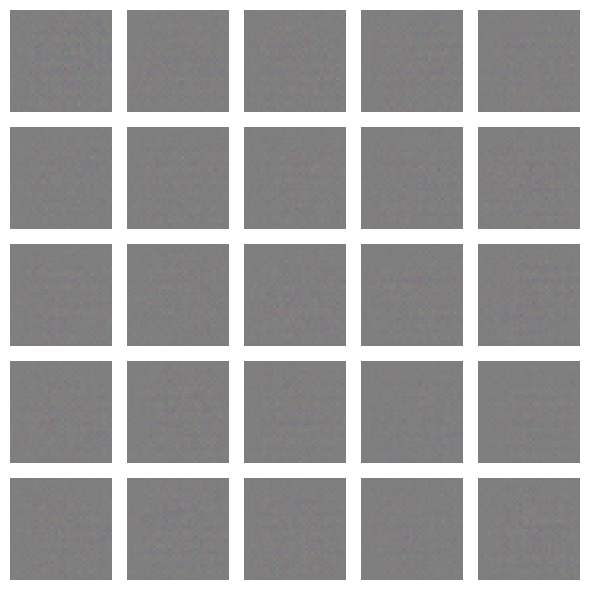

Época 1: Perda Discriminador = 0.6919, Perda Gerador = 0.7406
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


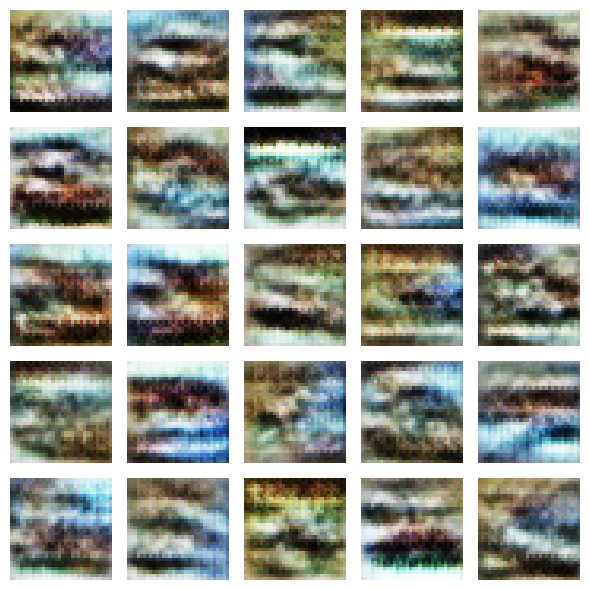

Época 2: Perda Discriminador = 0.6868, Perda Gerador = 0.7673
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


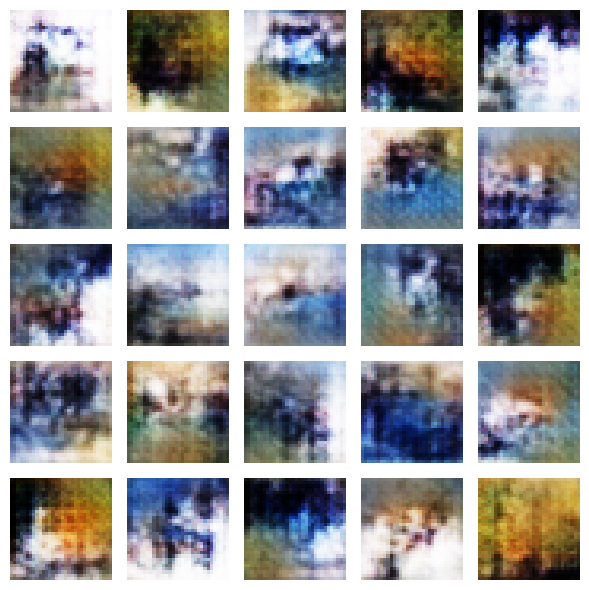

Época 3: Perda Discriminador = 0.6861, Perda Gerador = 0.7896
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


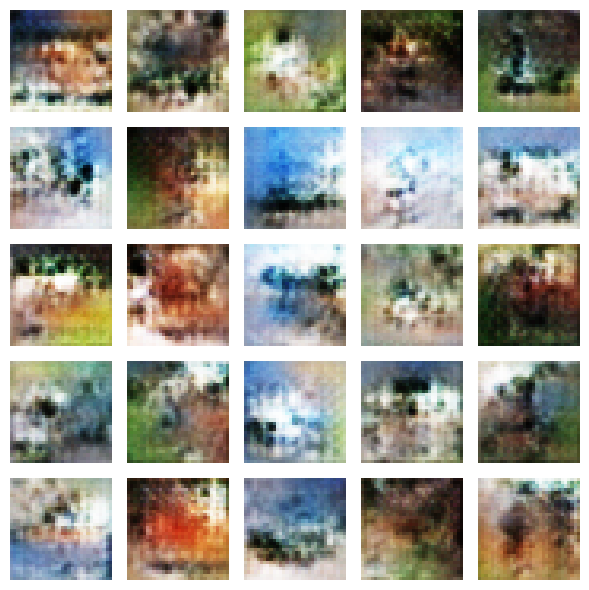

Época 4: Perda Discriminador = 0.6792, Perda Gerador = 0.8222
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


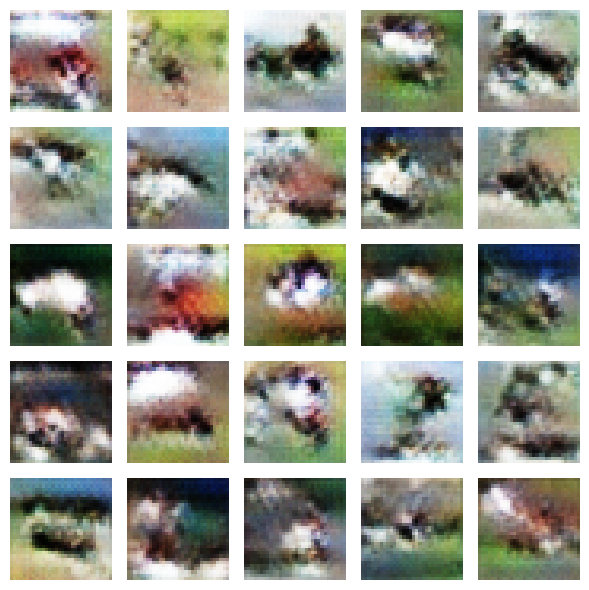

Época 5: Perda Discriminador = 0.6608, Perda Gerador = 0.8971
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


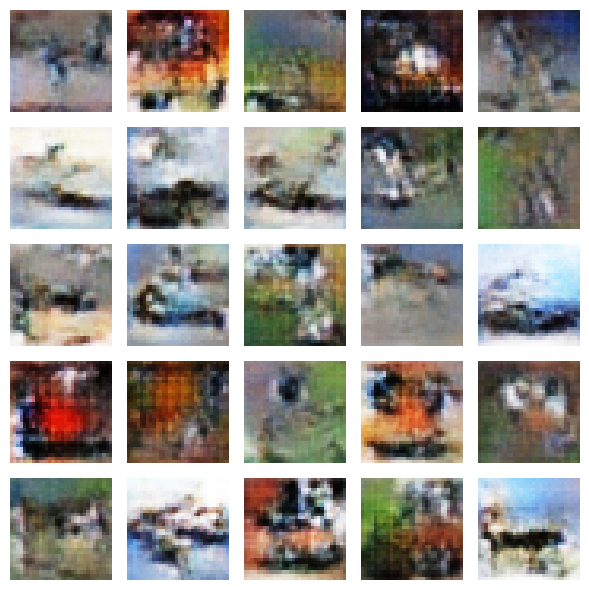

Época 6: Perda Discriminador = 0.6654, Perda Gerador = 0.9096
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


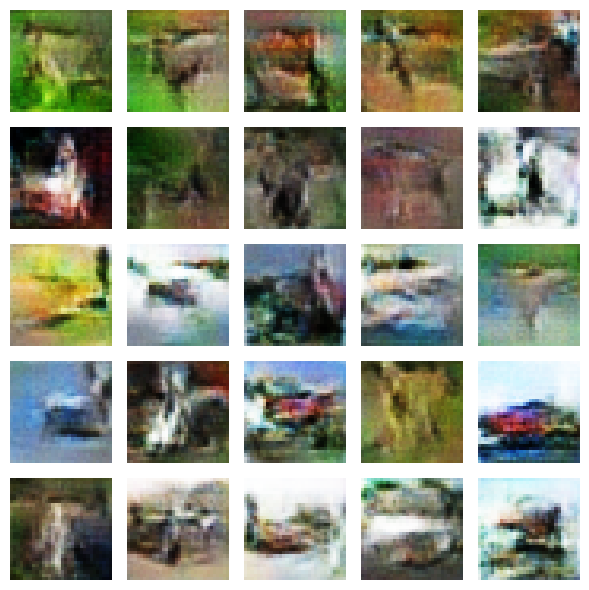

Época 7: Perda Discriminador = 0.6737, Perda Gerador = 0.8789
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


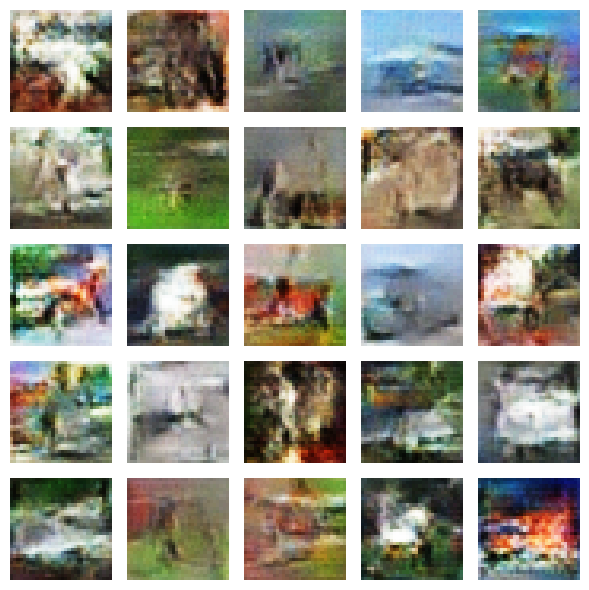

Época 8: Perda Discriminador = 0.6773, Perda Gerador = 0.8617
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


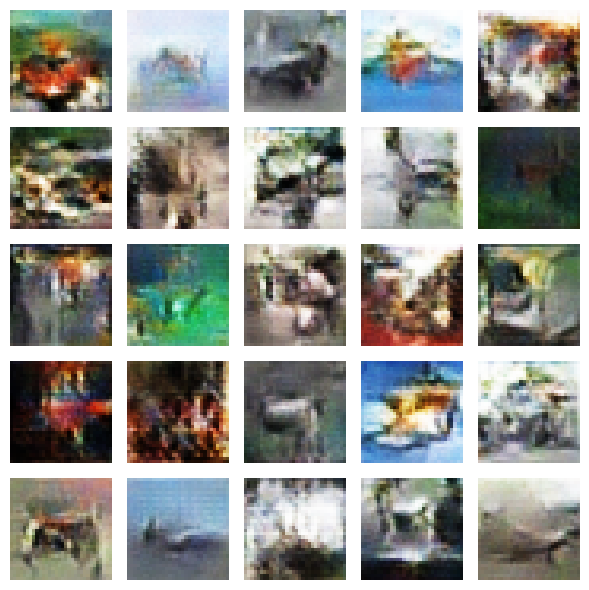

Época 9: Perda Discriminador = 0.6771, Perda Gerador = 0.8611
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


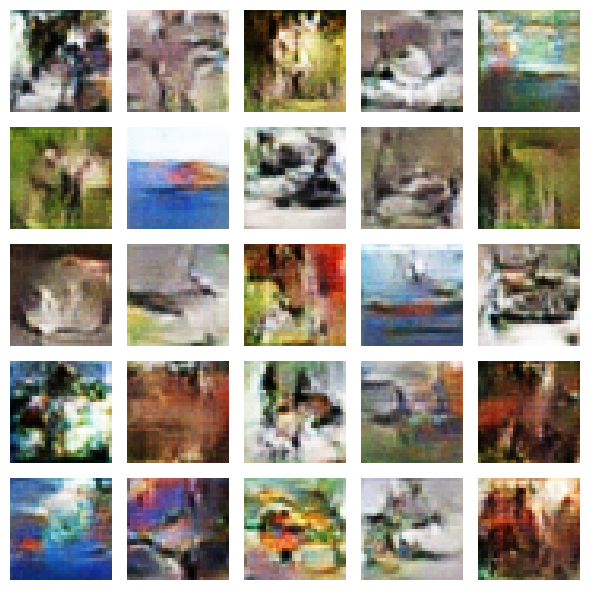

Época 10: Perda Discriminador = 0.6740, Perda Gerador = 0.8711
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


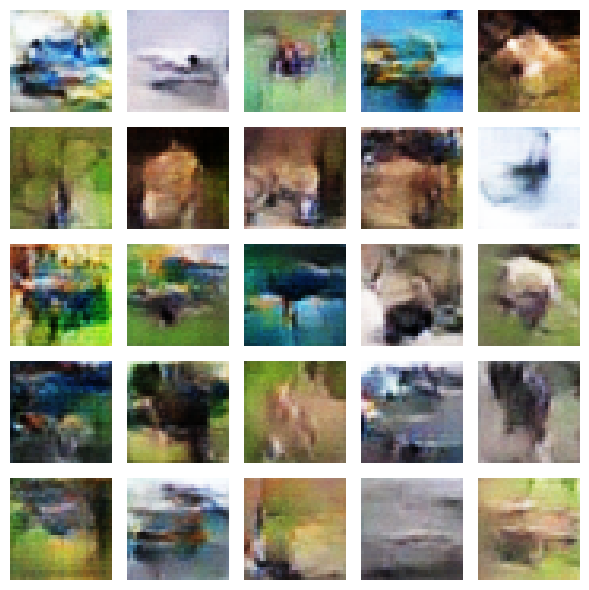

Época 11: Perda Discriminador = 0.6695, Perda Gerador = 0.8909
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


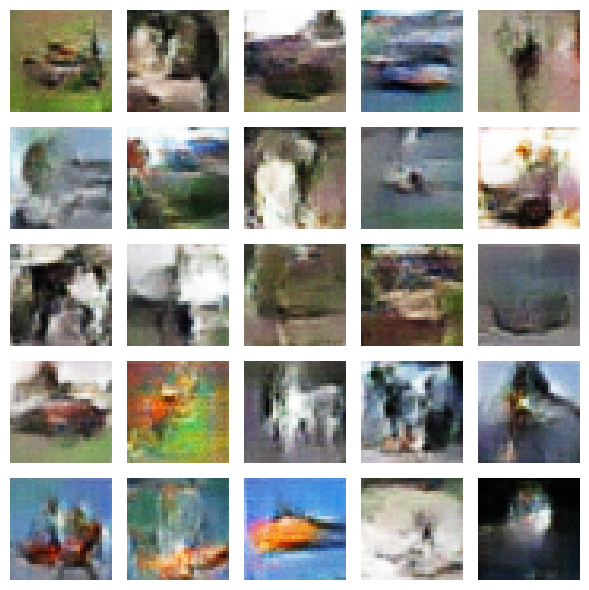

Época 12: Perda Discriminador = 0.6698, Perda Gerador = 0.8954
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


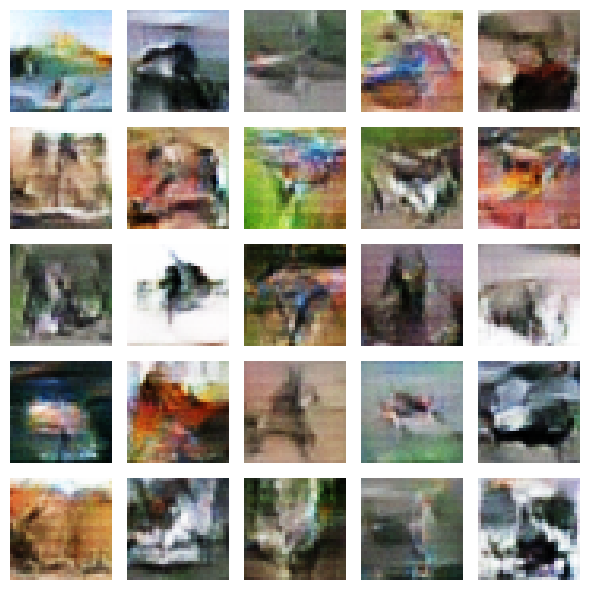

Época 13: Perda Discriminador = 0.6696, Perda Gerador = 0.8923
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


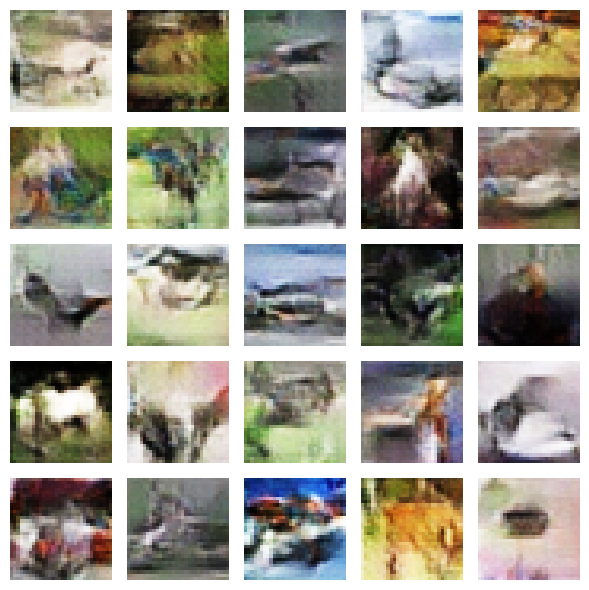

Época 14: Perda Discriminador = 0.6710, Perda Gerador = 0.8837
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


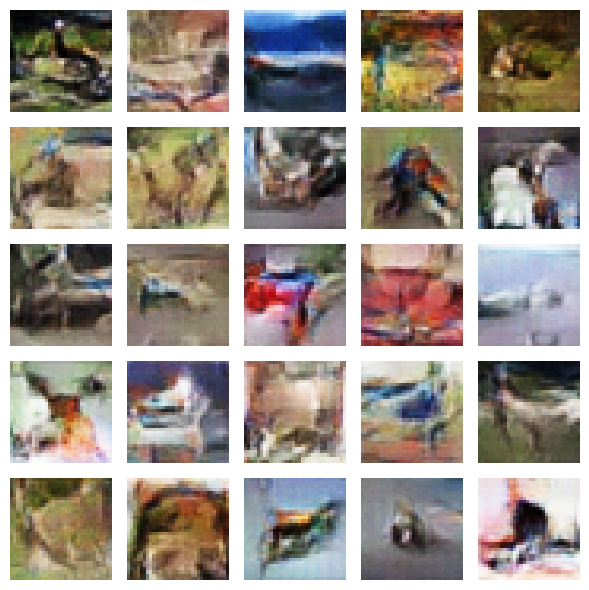

Época 15: Perda Discriminador = 0.6711, Perda Gerador = 0.8895
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


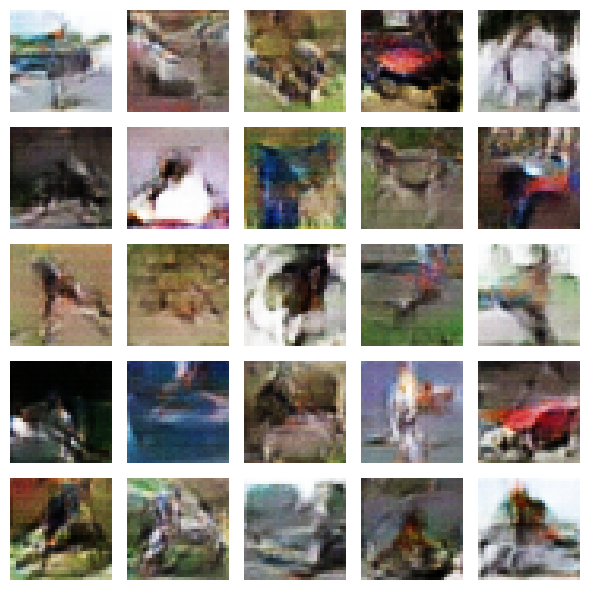

Época 16: Perda Discriminador = 0.6721, Perda Gerador = 0.8948
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


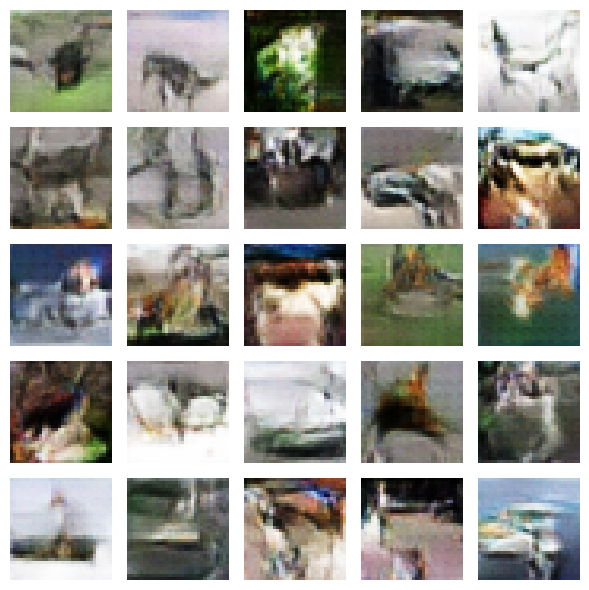

Época 17: Perda Discriminador = 0.6721, Perda Gerador = 0.8968
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


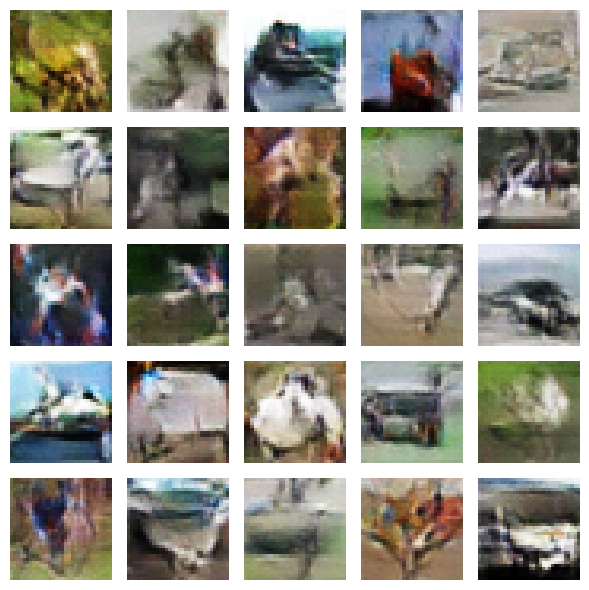

Época 18: Perda Discriminador = 0.6725, Perda Gerador = 0.9019
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


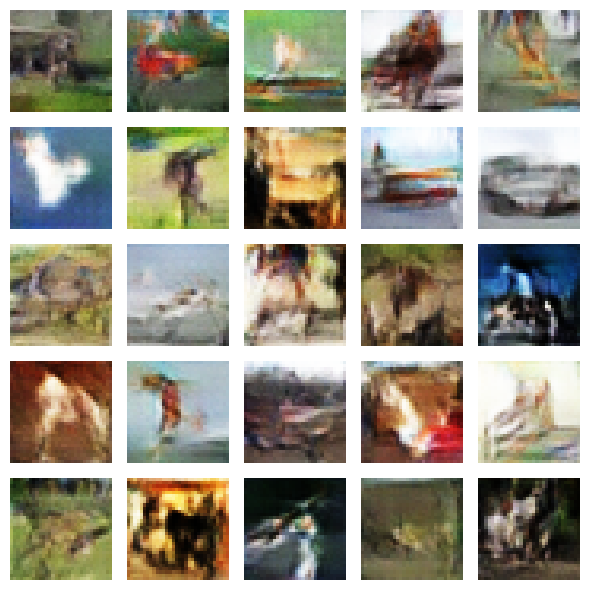

Época 19: Perda Discriminador = 0.6719, Perda Gerador = 0.9103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


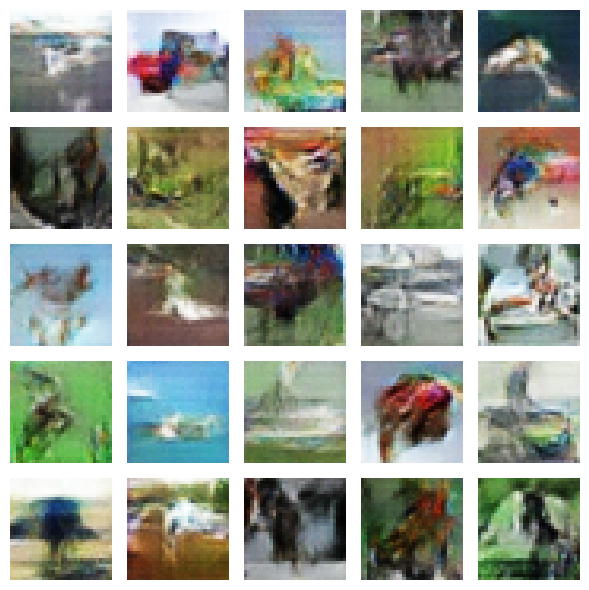

Época 20: Perda Discriminador = 0.6722, Perda Gerador = 0.9163
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


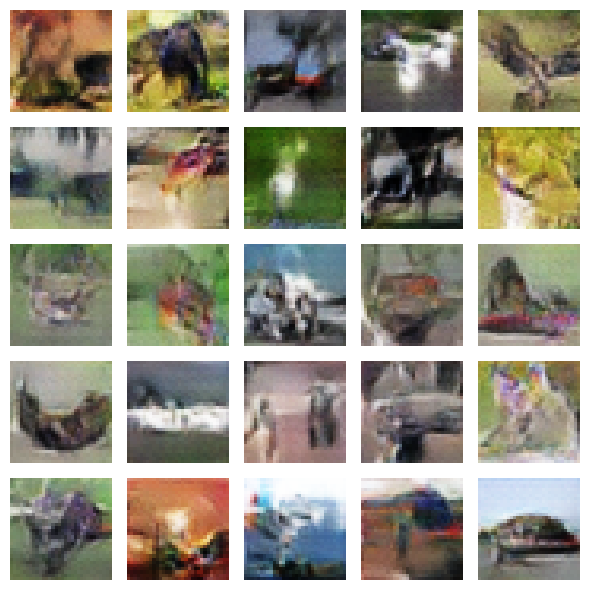

Época 21: Perda Discriminador = 0.6701, Perda Gerador = 0.9223
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


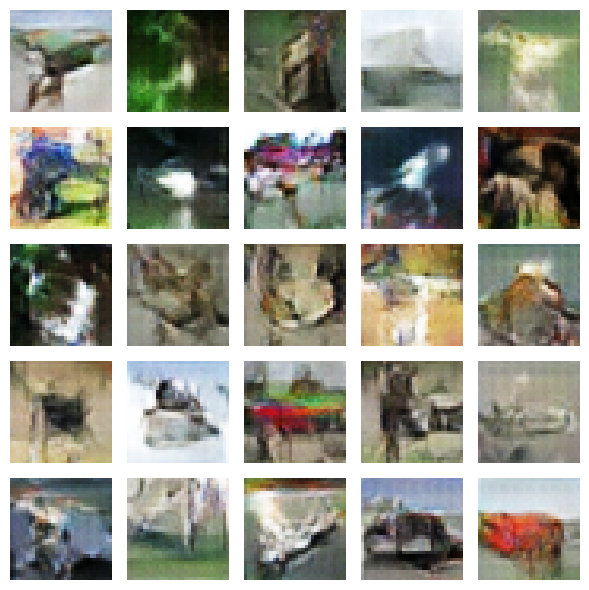

Época 22: Perda Discriminador = 0.6703, Perda Gerador = 0.9343
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


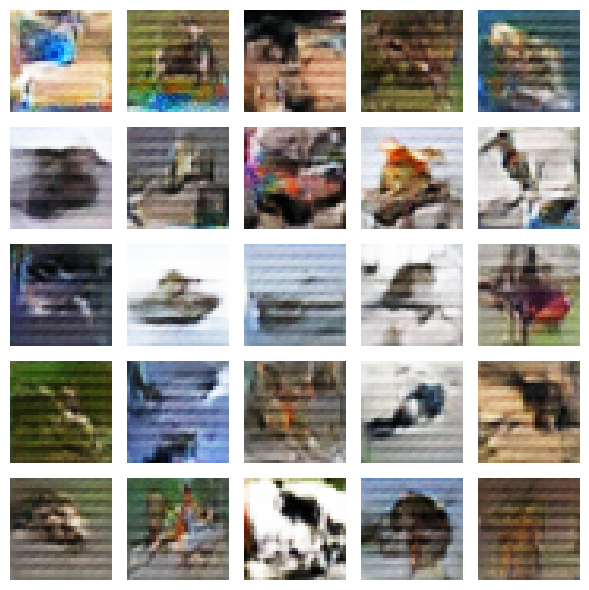

Época 23: Perda Discriminador = 0.6701, Perda Gerador = 0.9390
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


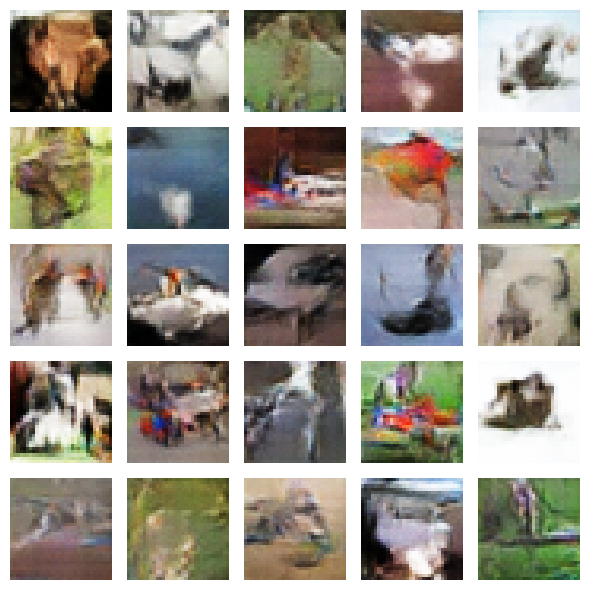

Época 24: Perda Discriminador = 0.6688, Perda Gerador = 0.9493
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


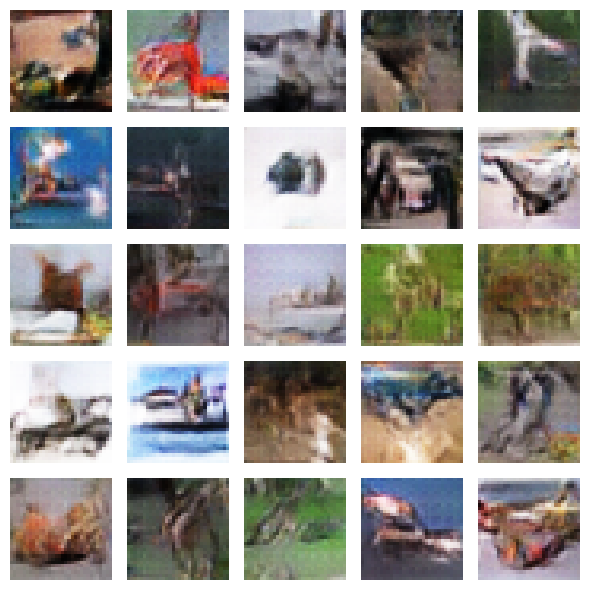

Época 25: Perda Discriminador = 0.6692, Perda Gerador = 0.9586
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


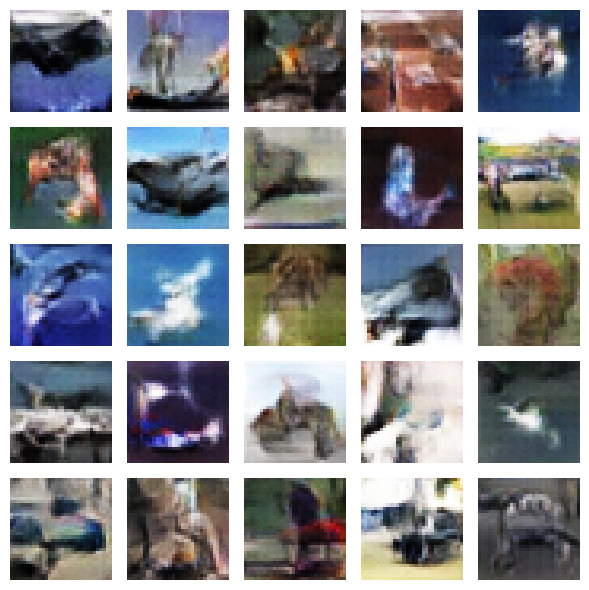

Época 26: Perda Discriminador = 0.6669, Perda Gerador = 0.9652
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


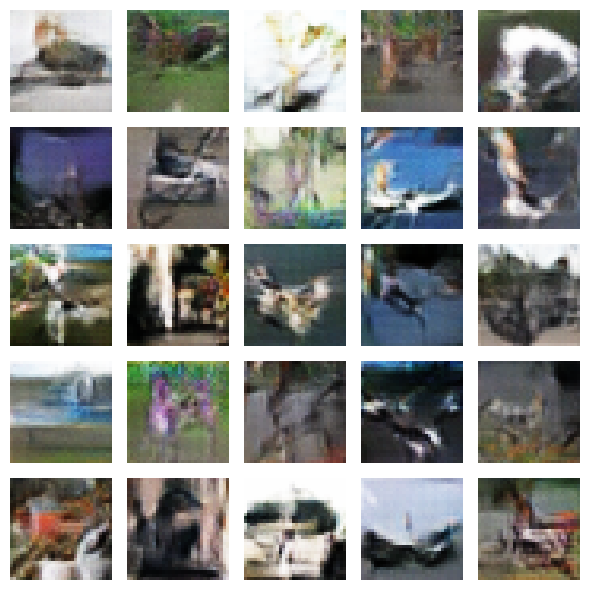

Época 27: Perda Discriminador = 0.6664, Perda Gerador = 0.9687
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


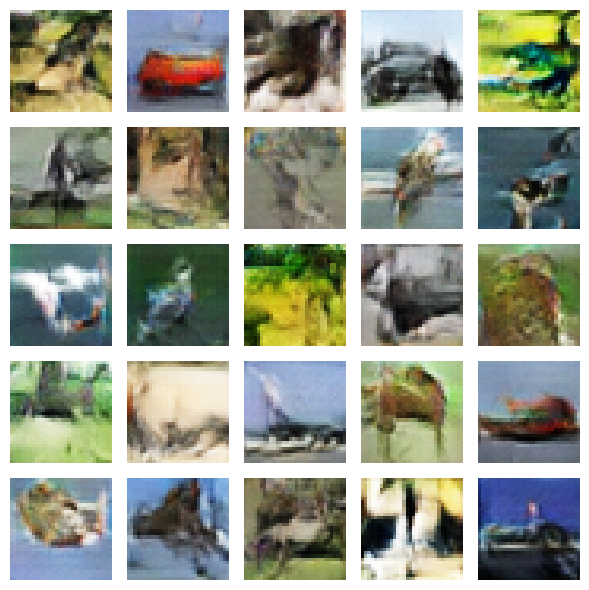

Época 28: Perda Discriminador = 0.6663, Perda Gerador = 0.9706
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


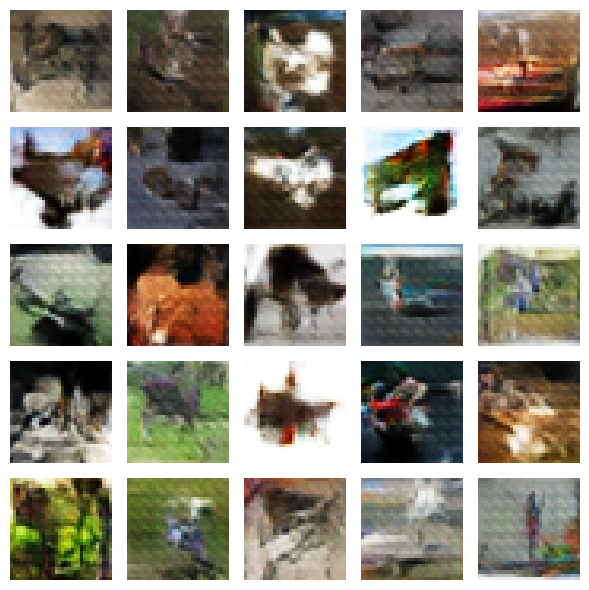

Época 29: Perda Discriminador = 0.6654, Perda Gerador = 0.9810
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


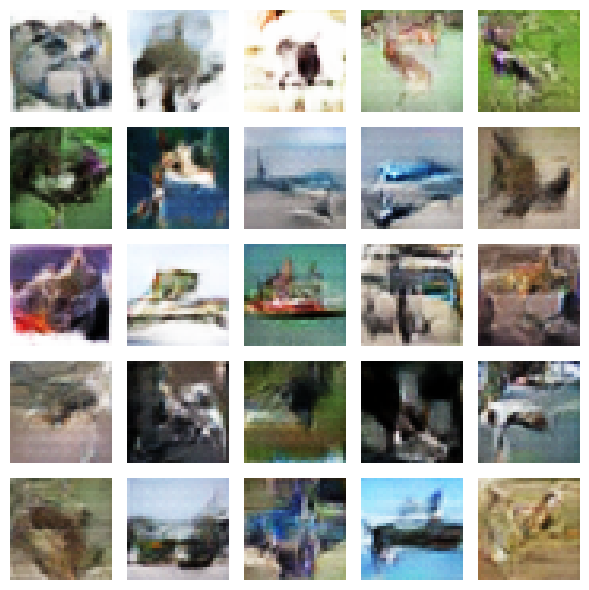

Época 30: Perda Discriminador = 0.6642, Perda Gerador = 0.9920
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


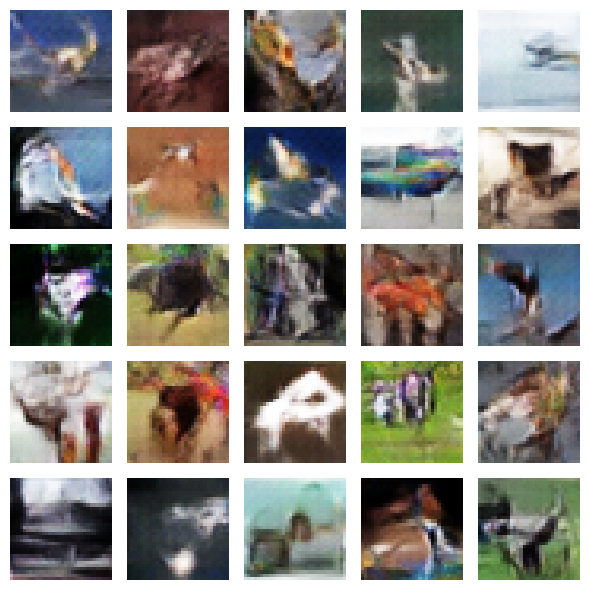

Época 31: Perda Discriminador = 0.6643, Perda Gerador = 0.9979
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


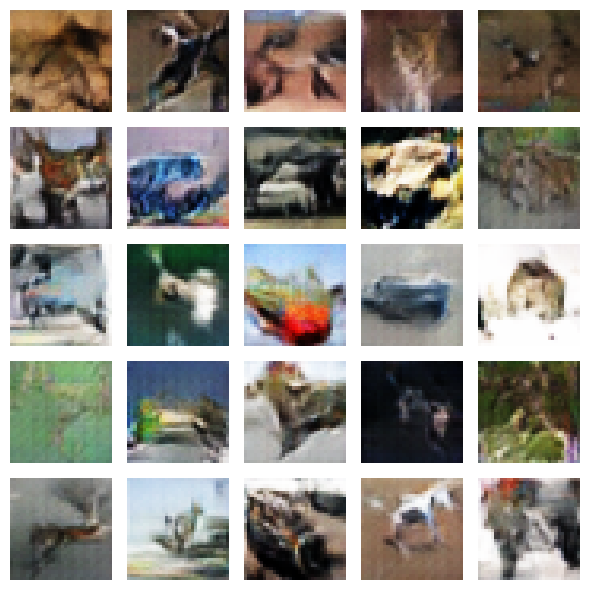

Época 32: Perda Discriminador = 0.6637, Perda Gerador = 1.0058
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


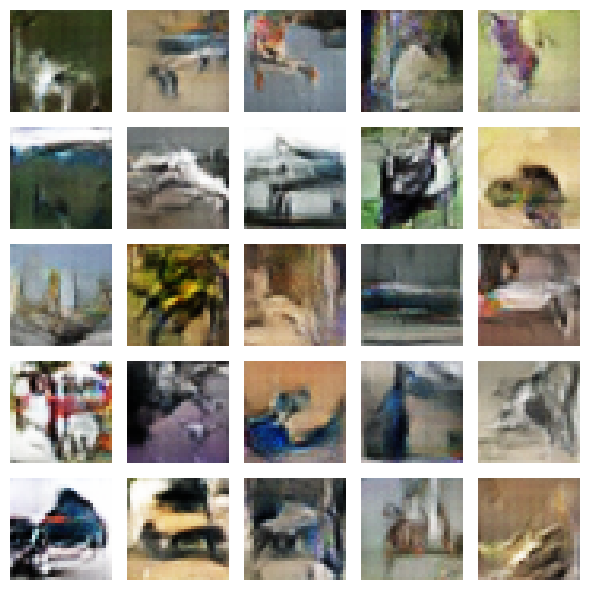

Época 33: Perda Discriminador = 0.6627, Perda Gerador = 1.0083
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


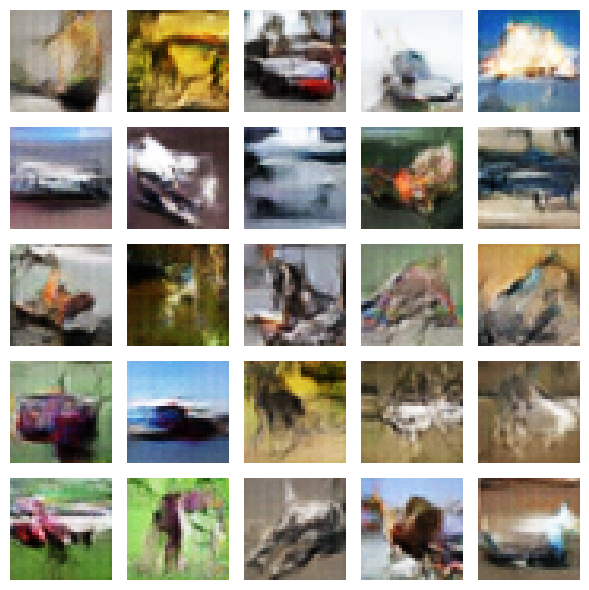

Época 34: Perda Discriminador = 0.6631, Perda Gerador = 1.0173
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


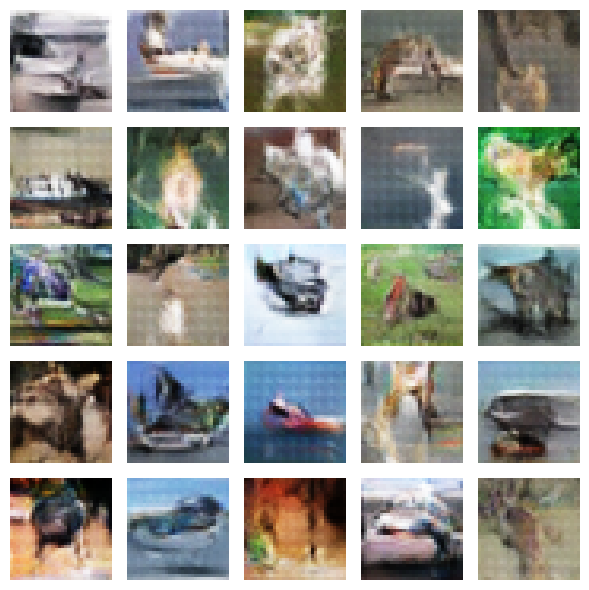

Época 35: Perda Discriminador = 0.6616, Perda Gerador = 1.0230
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


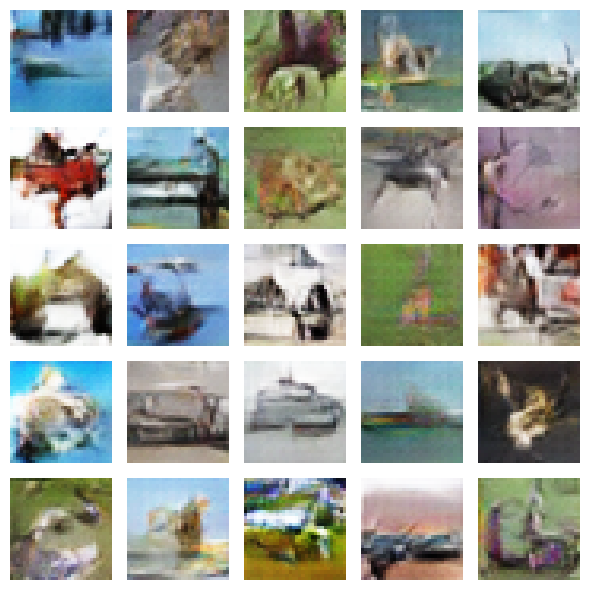

Época 36: Perda Discriminador = 0.6604, Perda Gerador = 1.0332
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


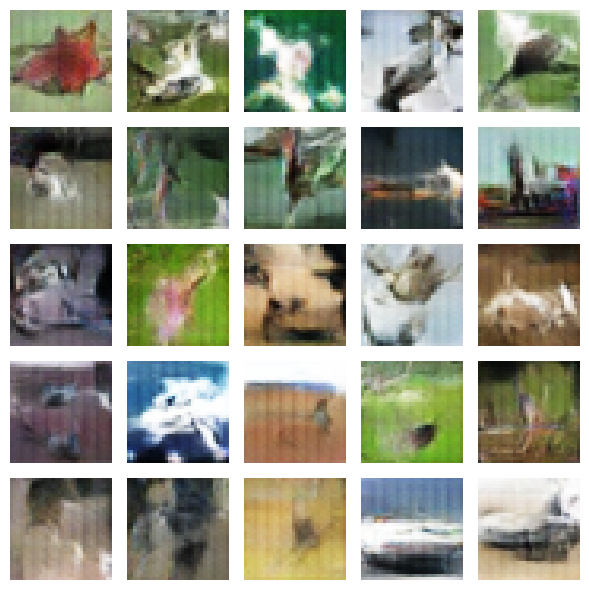

Época 37: Perda Discriminador = 0.6610, Perda Gerador = 1.0347
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


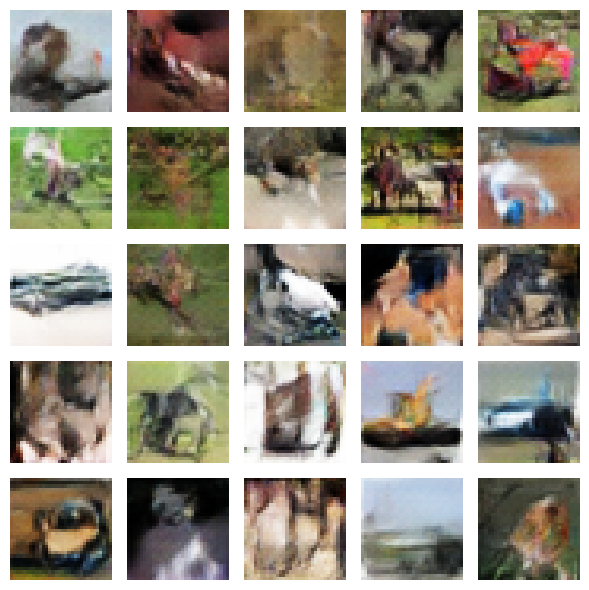

Época 38: Perda Discriminador = 0.6603, Perda Gerador = 1.0432
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


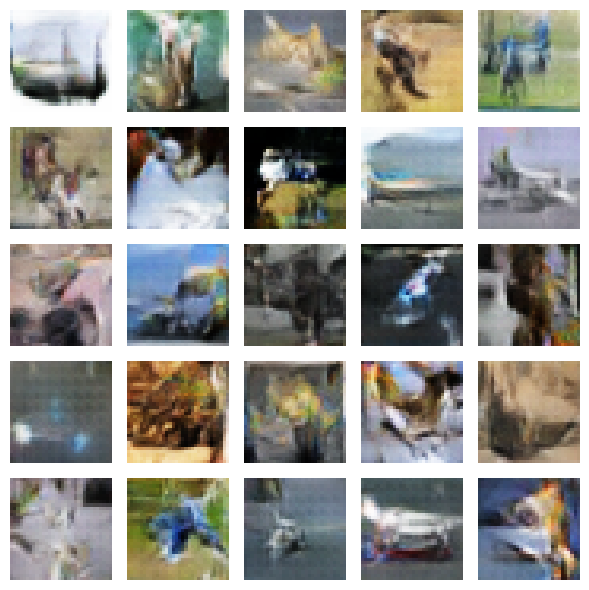

Época 39: Perda Discriminador = 0.6573, Perda Gerador = 1.0536
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


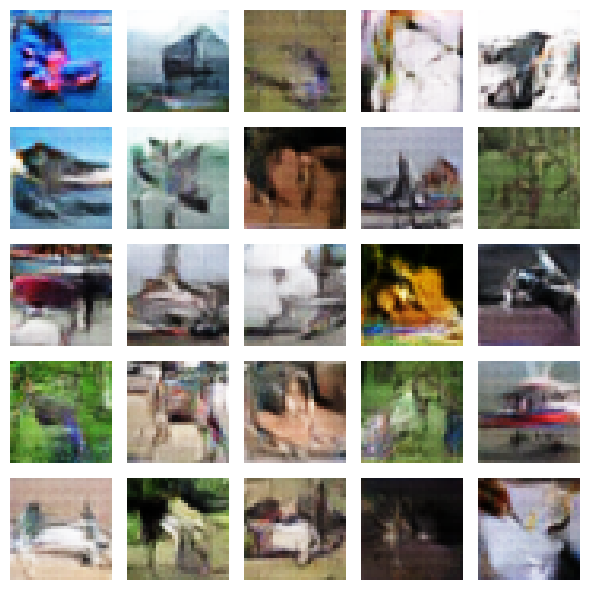

Época 40: Perda Discriminador = 0.6578, Perda Gerador = 1.0696
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


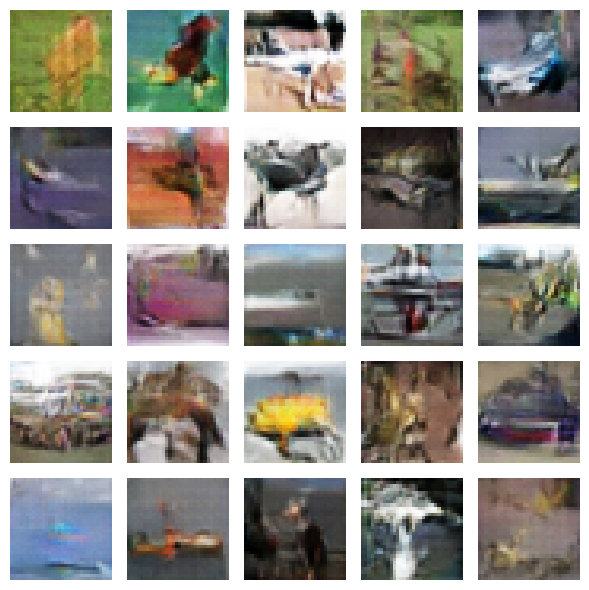

Época 41: Perda Discriminador = 0.6585, Perda Gerador = 1.0746
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


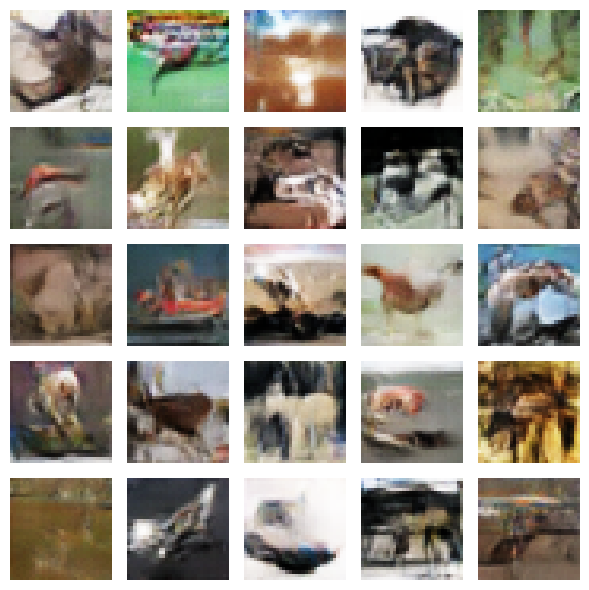

Época 42: Perda Discriminador = 0.6576, Perda Gerador = 1.0767
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


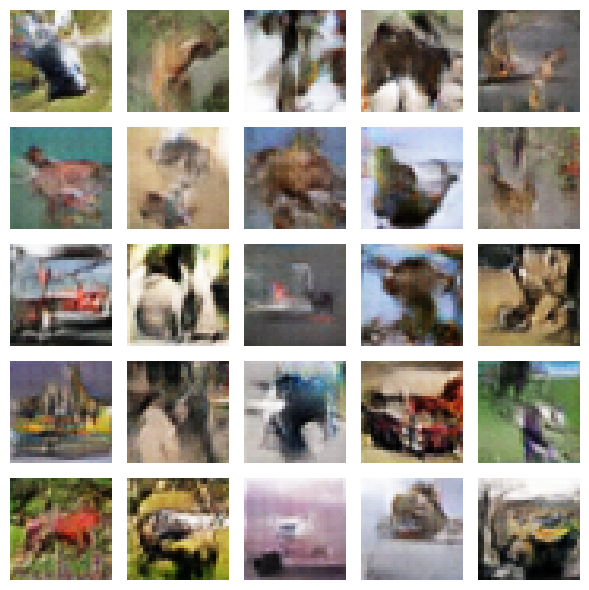

Época 43: Perda Discriminador = 0.6568, Perda Gerador = 1.0856
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


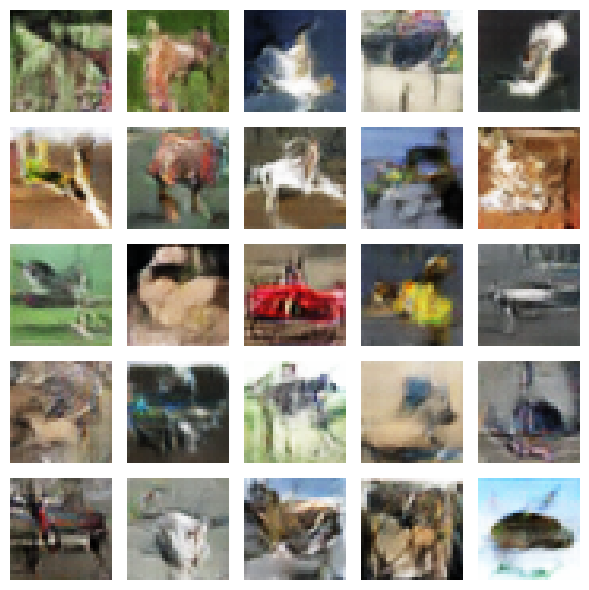

Época 44: Perda Discriminador = 0.6555, Perda Gerador = 1.0909
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


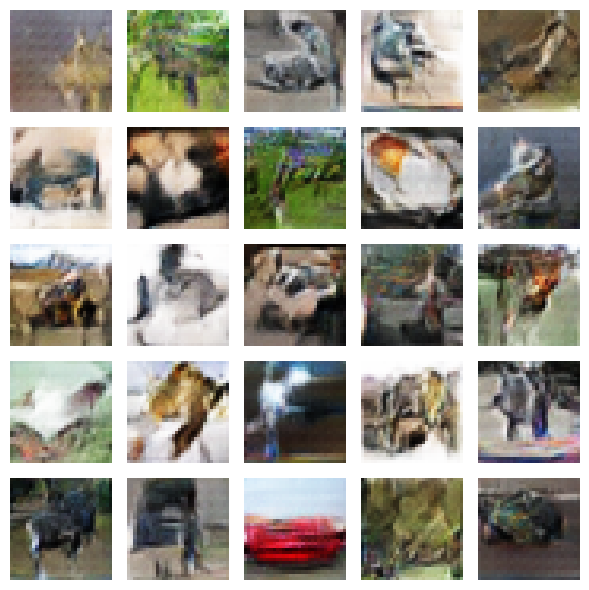

Época 45: Perda Discriminador = 0.6524, Perda Gerador = 1.1103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


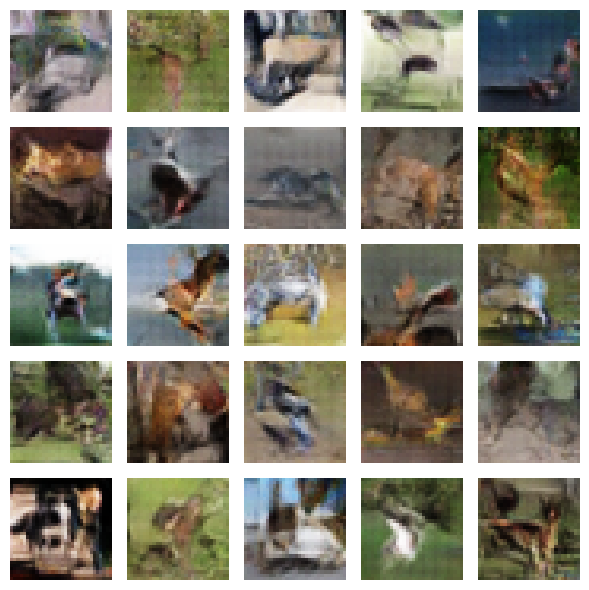

Época 46: Perda Discriminador = 0.6533, Perda Gerador = 1.1130
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


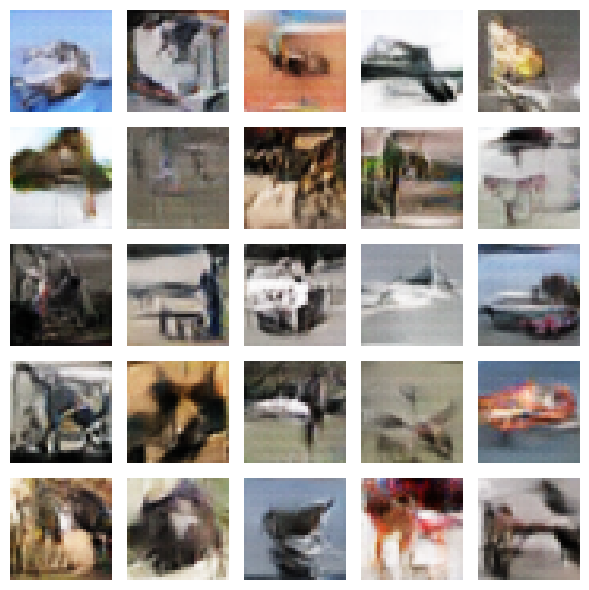

Época 47: Perda Discriminador = 0.6523, Perda Gerador = 1.1182
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


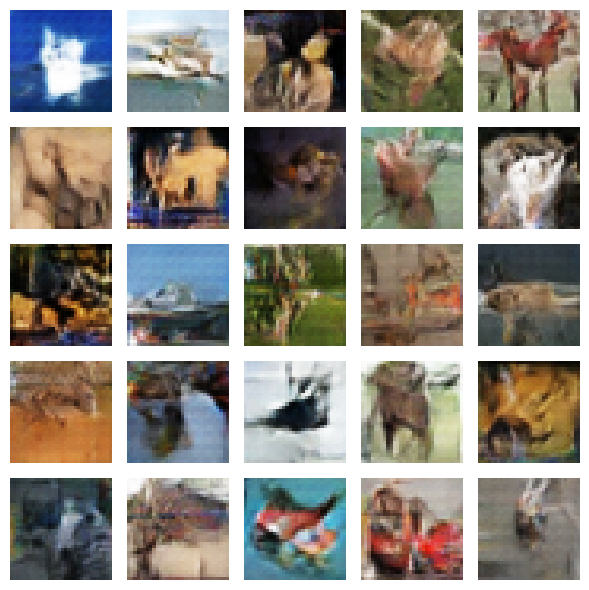

Época 48: Perda Discriminador = 0.6515, Perda Gerador = 1.1229
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


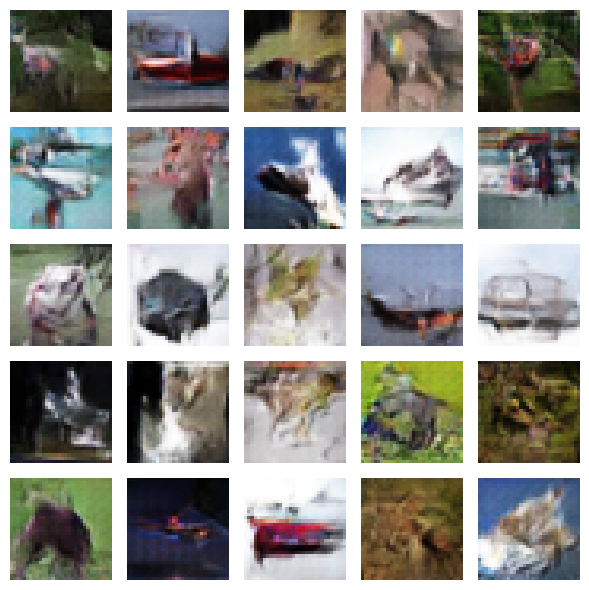

Época 49: Perda Discriminador = 0.6498, Perda Gerador = 1.1436
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


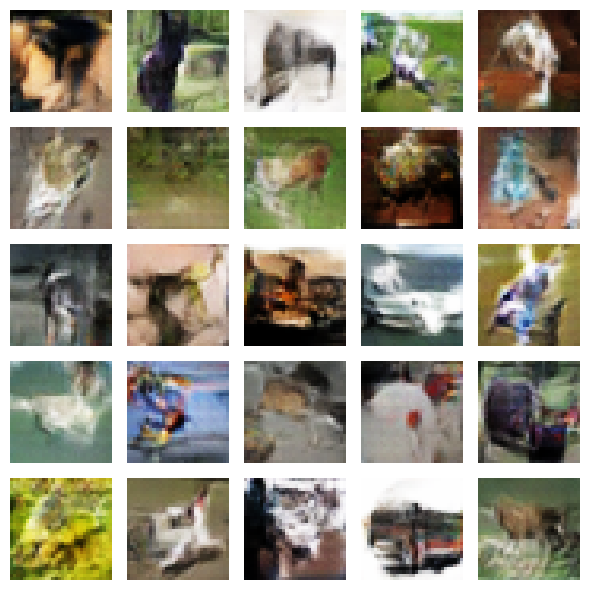

Época 50: Perda Discriminador = 0.6493, Perda Gerador = 1.1437
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


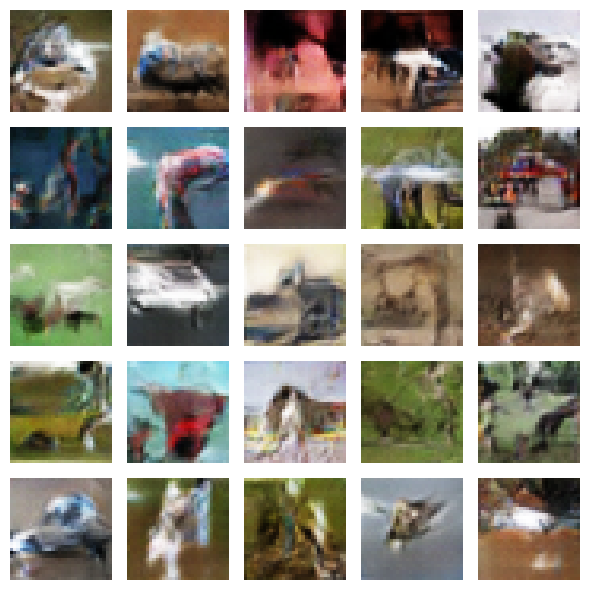

Época 51: Perda Discriminador = 0.6474, Perda Gerador = 1.1502
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


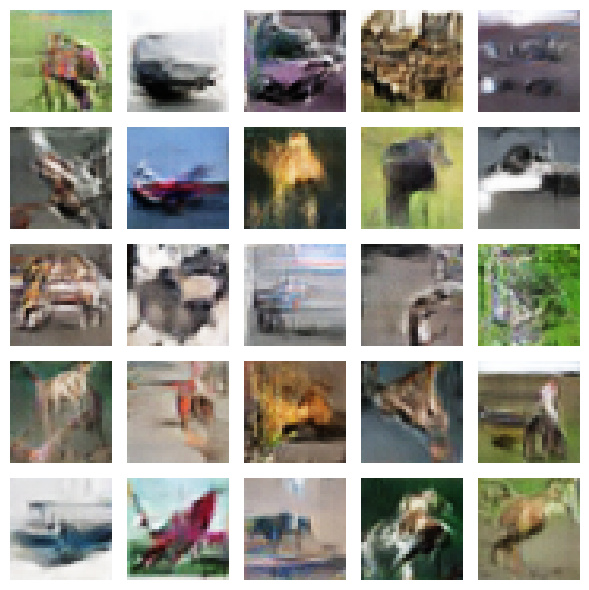

Época 52: Perda Discriminador = 0.6459, Perda Gerador = 1.1545
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


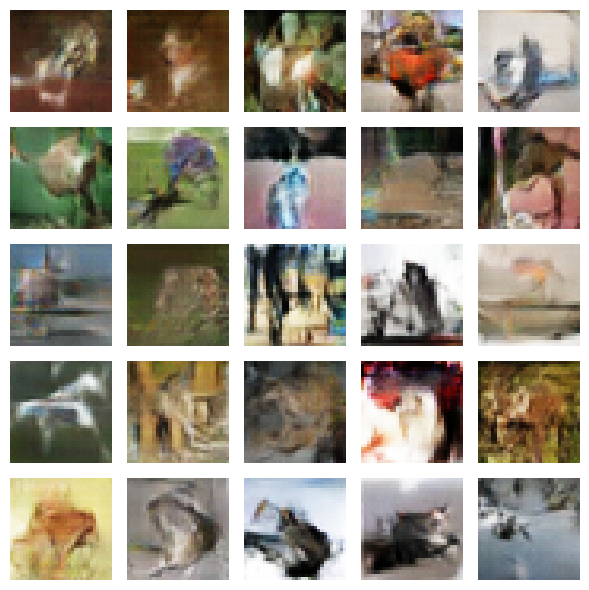

Época 53: Perda Discriminador = 0.6458, Perda Gerador = 1.1729
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


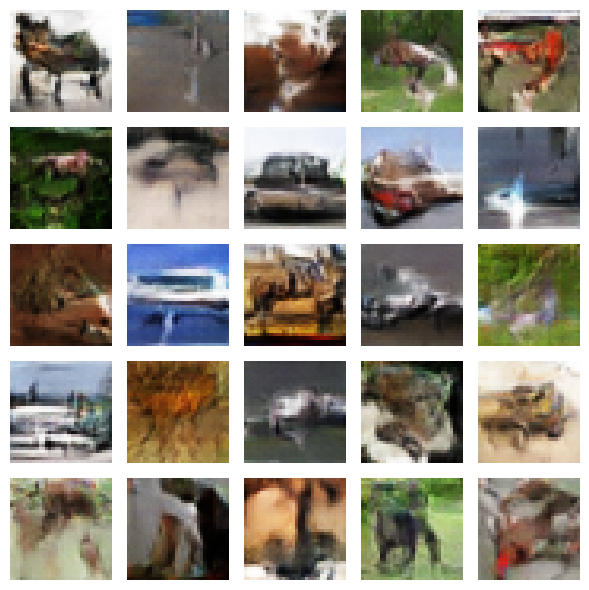

Época 54: Perda Discriminador = 0.6441, Perda Gerador = 1.1840
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


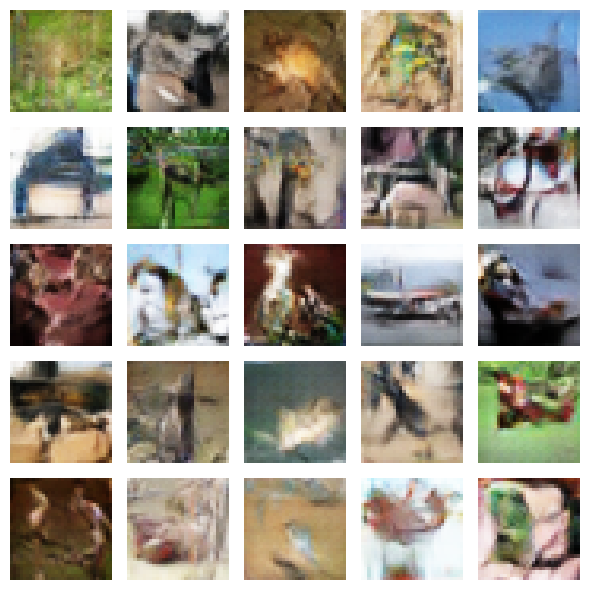

Época 55: Perda Discriminador = 0.6435, Perda Gerador = 1.1918
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


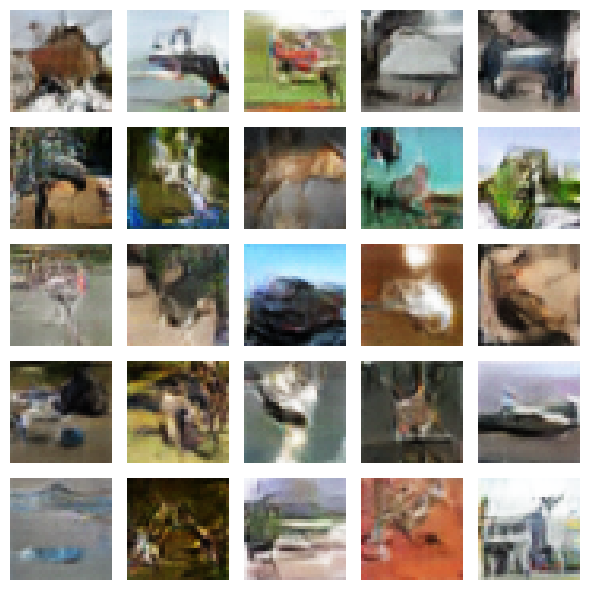

Época 56: Perda Discriminador = 0.6410, Perda Gerador = 1.2005
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


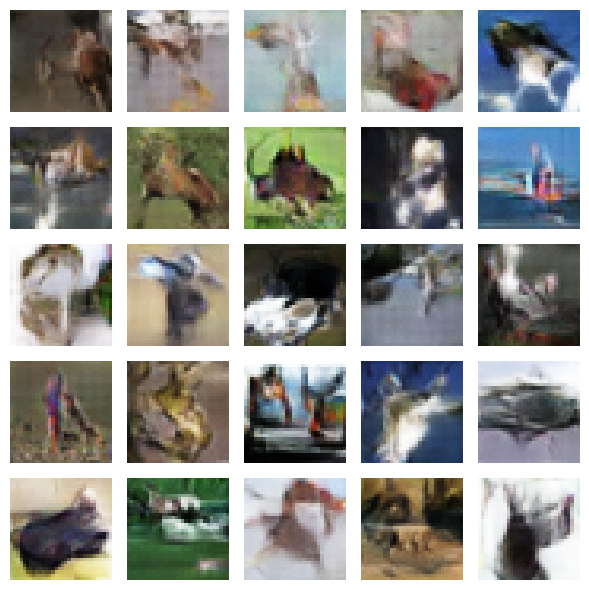

Época 57: Perda Discriminador = 0.6403, Perda Gerador = 1.2267
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


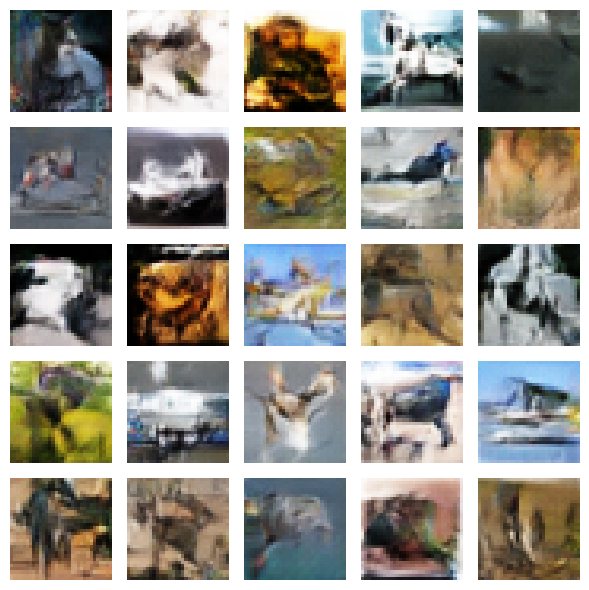

Época 58: Perda Discriminador = 0.6384, Perda Gerador = 1.2247
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


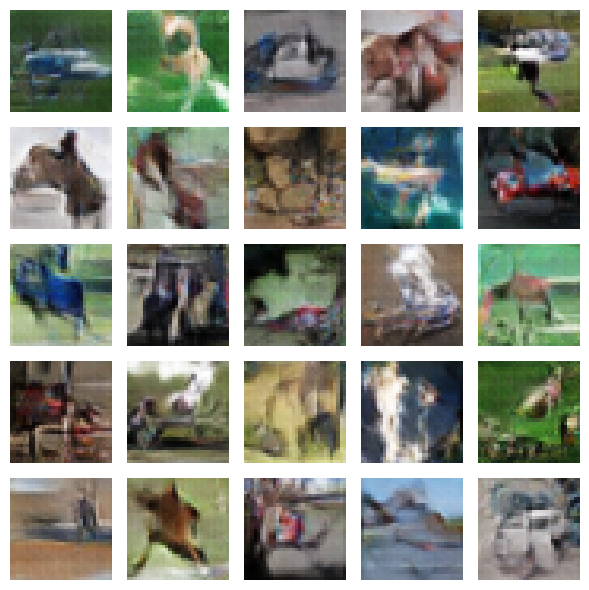

Época 59: Perda Discriminador = 0.6365, Perda Gerador = 1.2404
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


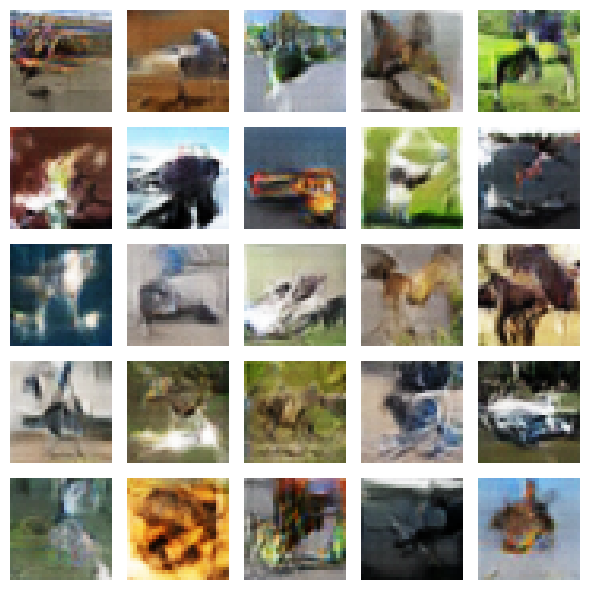

Época 60: Perda Discriminador = 0.6377, Perda Gerador = 1.2475
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


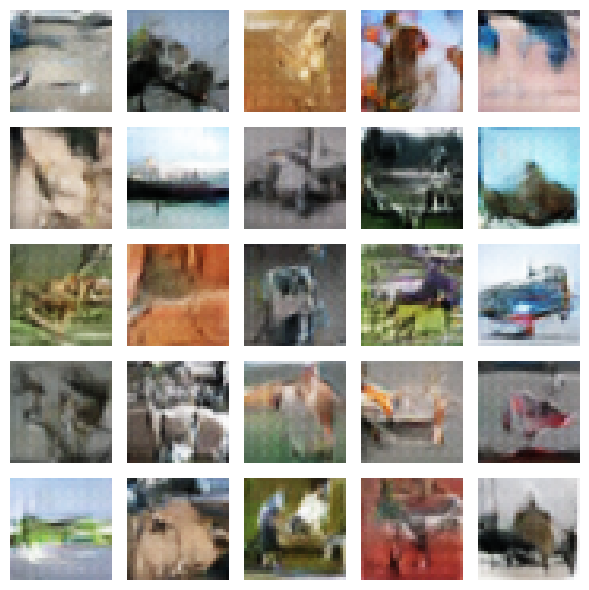

Época 61: Perda Discriminador = 0.6347, Perda Gerador = 1.2523
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


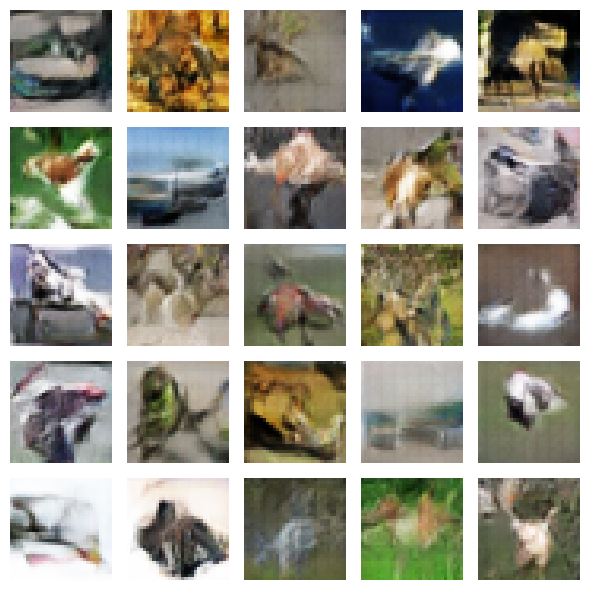

Época 62: Perda Discriminador = 0.6346, Perda Gerador = 1.2757
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


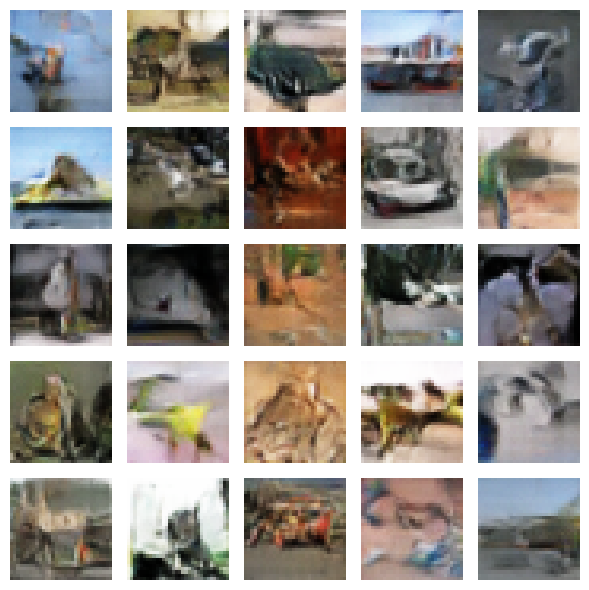

Época 63: Perda Discriminador = 0.6311, Perda Gerador = 1.2672
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


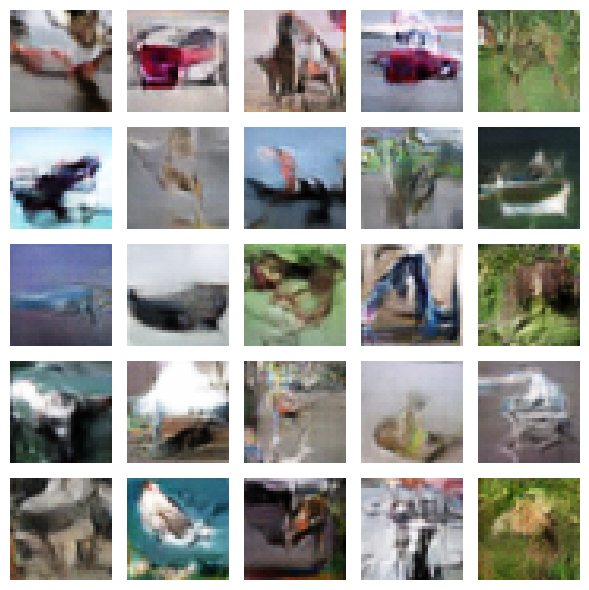

Época 64: Perda Discriminador = 0.6301, Perda Gerador = 1.2915
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


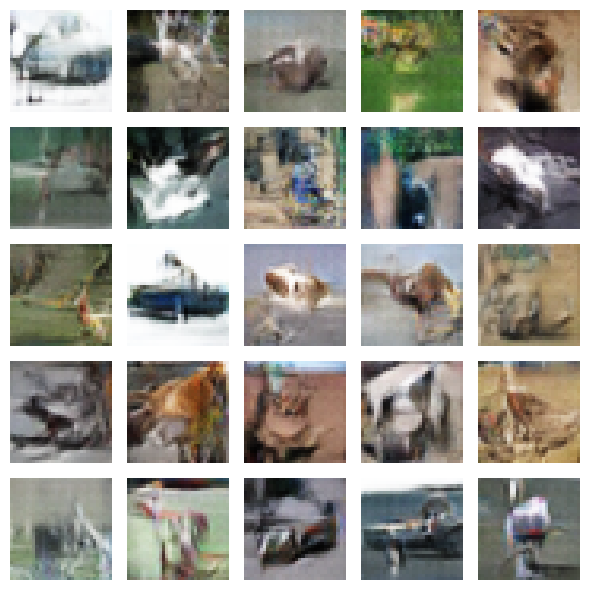

Época 65: Perda Discriminador = 0.6289, Perda Gerador = 1.3103
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


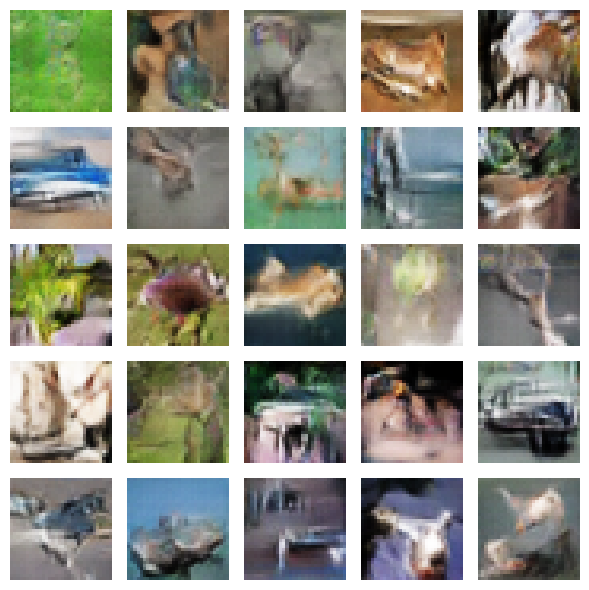

Época 66: Perda Discriminador = 0.6275, Perda Gerador = 1.3069
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


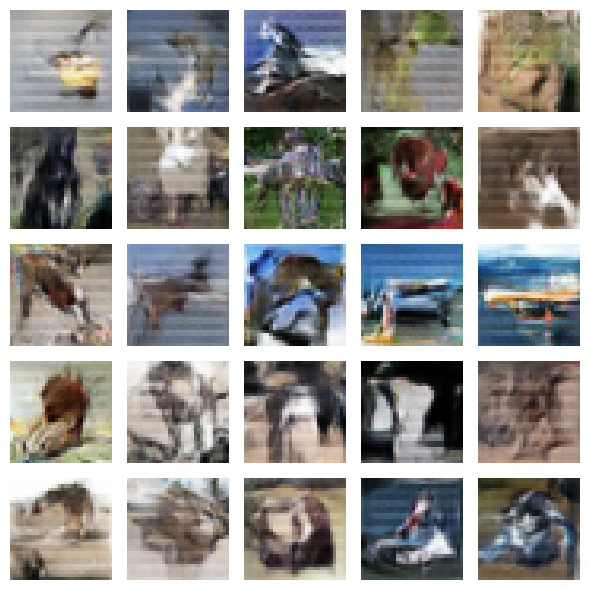

Época 67: Perda Discriminador = 0.6258, Perda Gerador = 1.3307
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


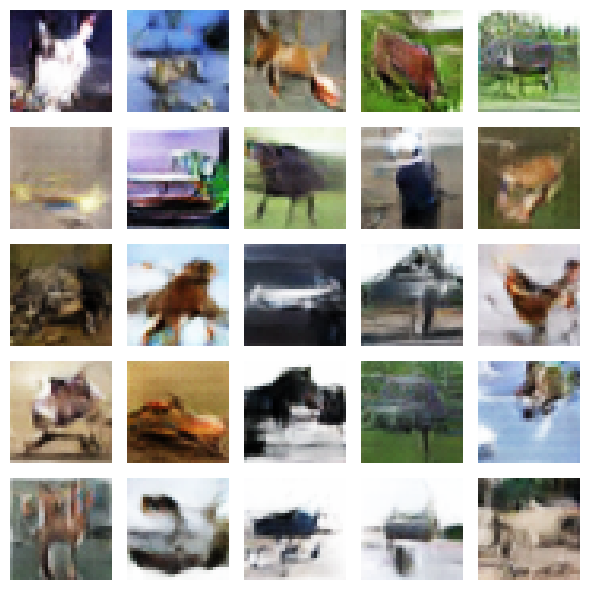

Época 68: Perda Discriminador = 0.6246, Perda Gerador = 1.3280
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


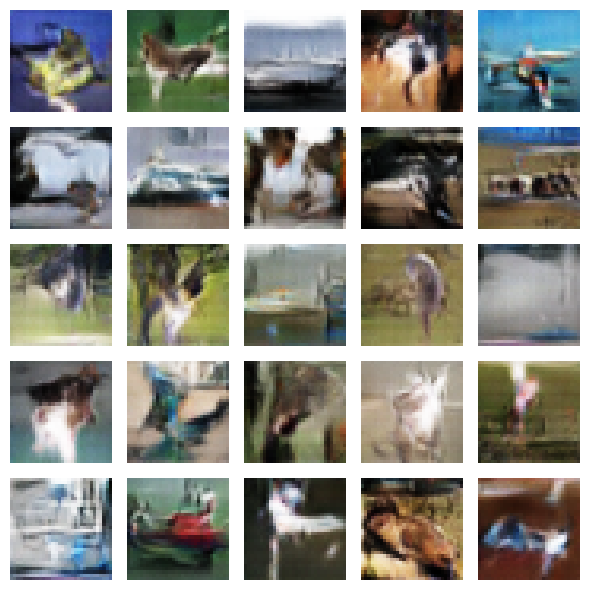

Época 69: Perda Discriminador = 0.6224, Perda Gerador = 1.3390
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


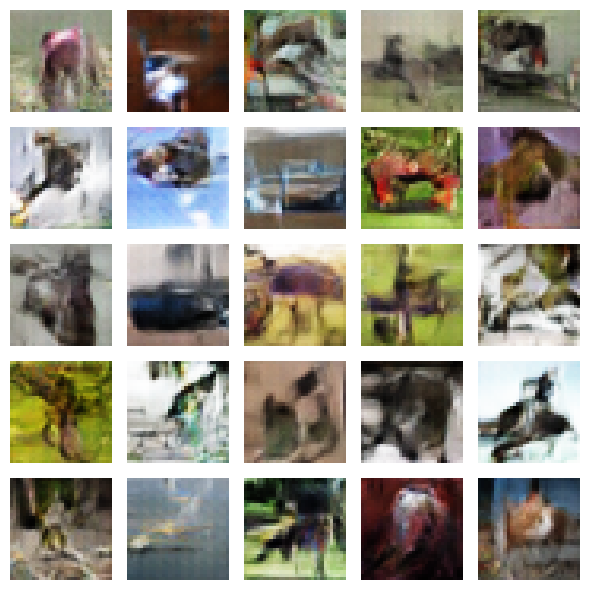

Época 70: Perda Discriminador = 0.6212, Perda Gerador = 1.3529
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


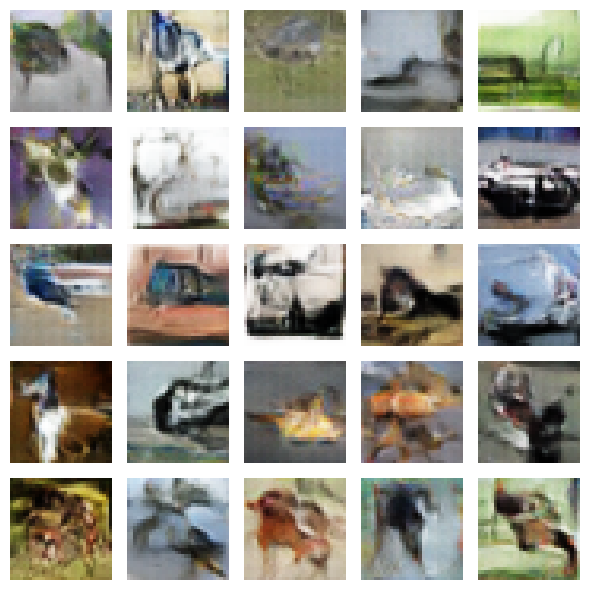

Época 71: Perda Discriminador = 0.6200, Perda Gerador = 1.3745
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


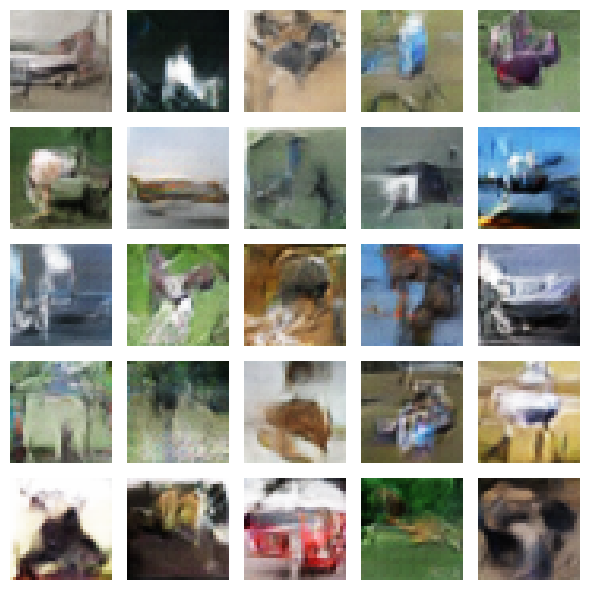

Época 72: Perda Discriminador = 0.6184, Perda Gerador = 1.3817
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


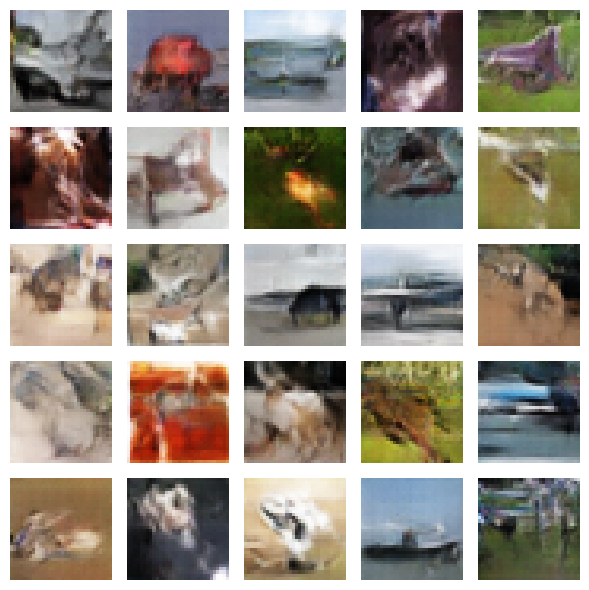

Época 73: Perda Discriminador = 0.6172, Perda Gerador = 1.3986
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


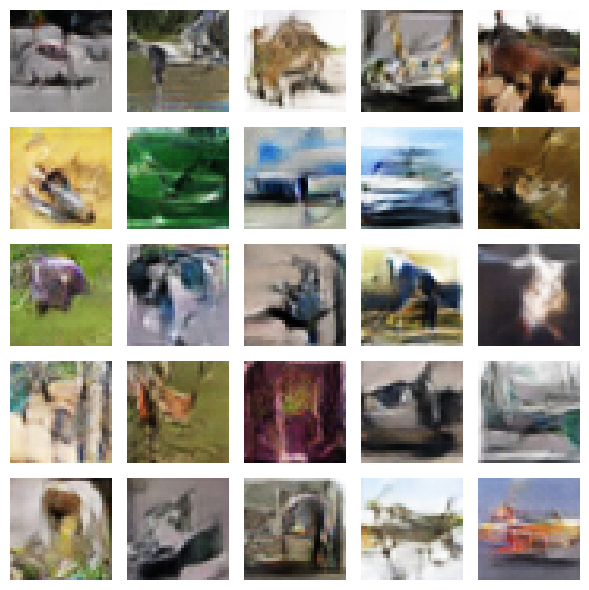

Época 74: Perda Discriminador = 0.6152, Perda Gerador = 1.4041
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


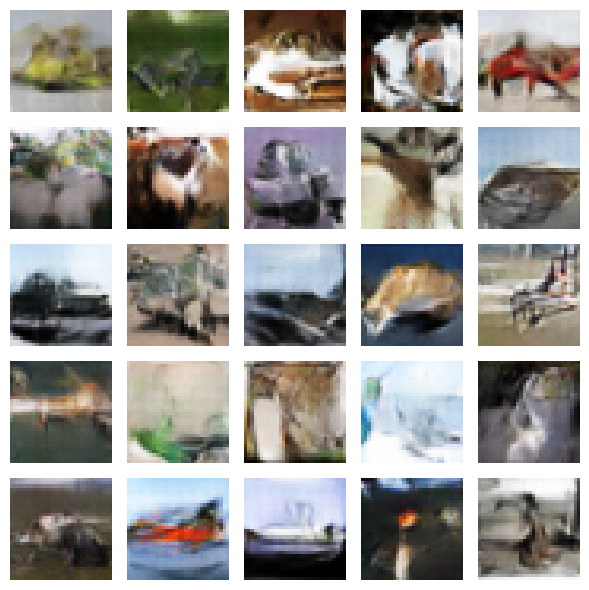

Época 75: Perda Discriminador = 0.6123, Perda Gerador = 1.4227
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


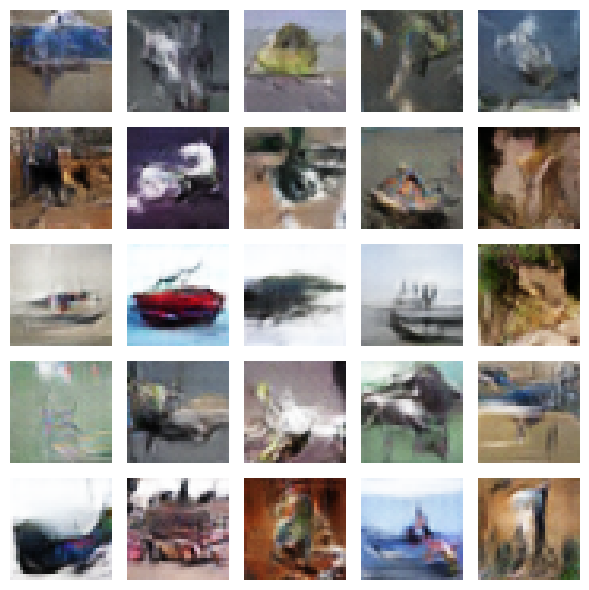

Época 76: Perda Discriminador = 0.6131, Perda Gerador = 1.4472
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


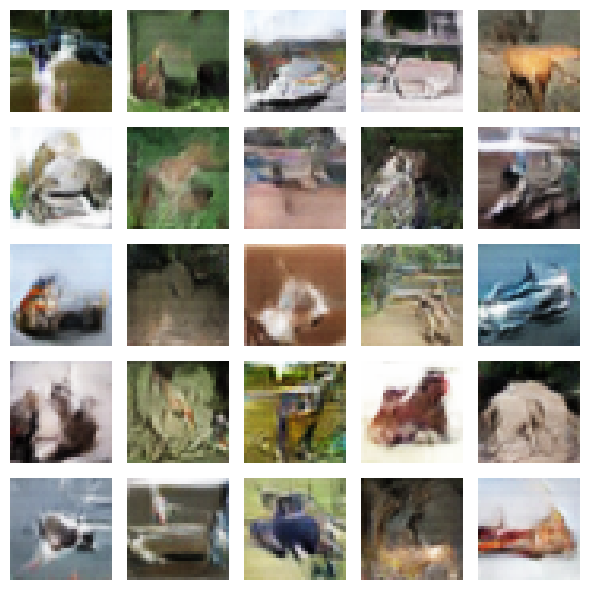

Época 77: Perda Discriminador = 0.6107, Perda Gerador = 1.4511
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


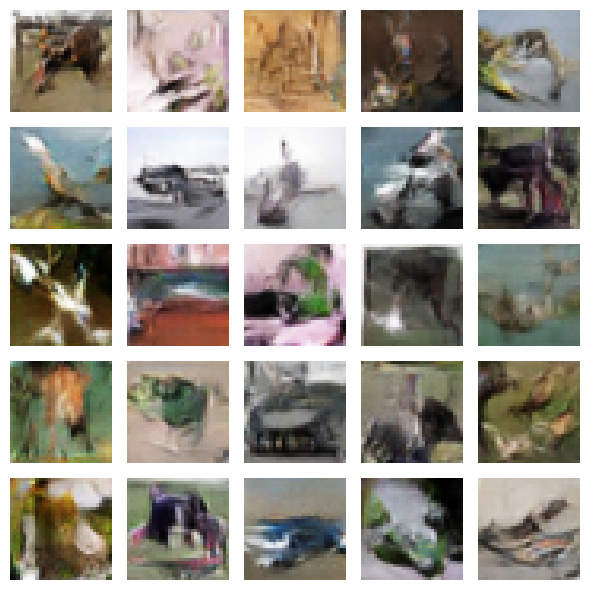

Época 78: Perda Discriminador = 0.6070, Perda Gerador = 1.4517
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


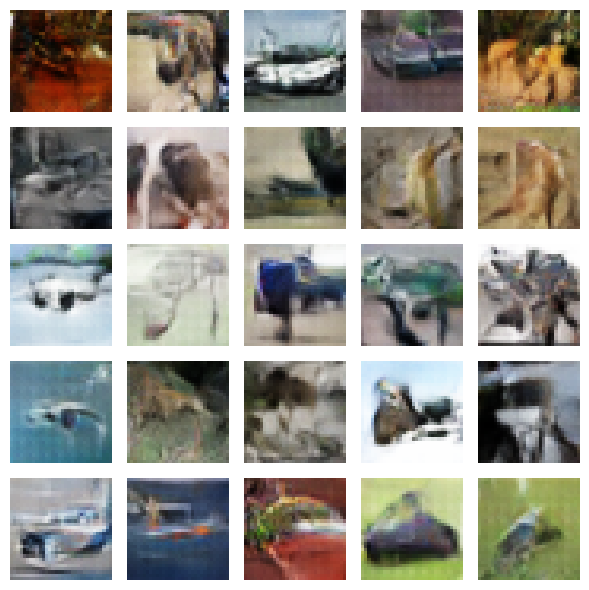

Época 79: Perda Discriminador = 0.6090, Perda Gerador = 1.4766
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


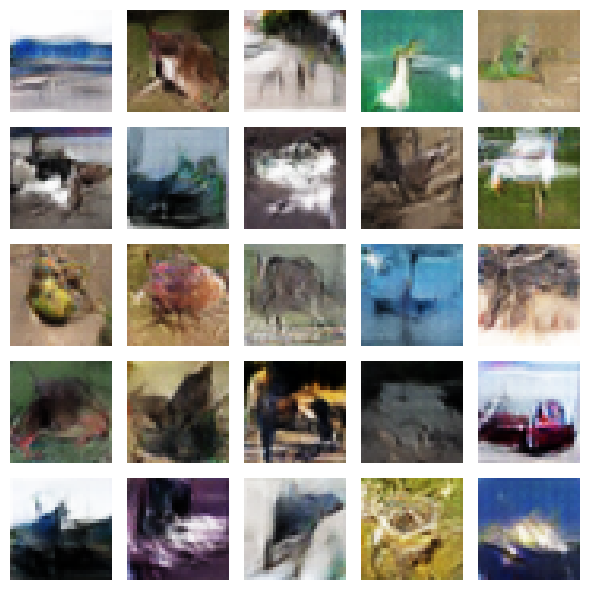

Época 80: Perda Discriminador = 0.6060, Perda Gerador = 1.4850
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


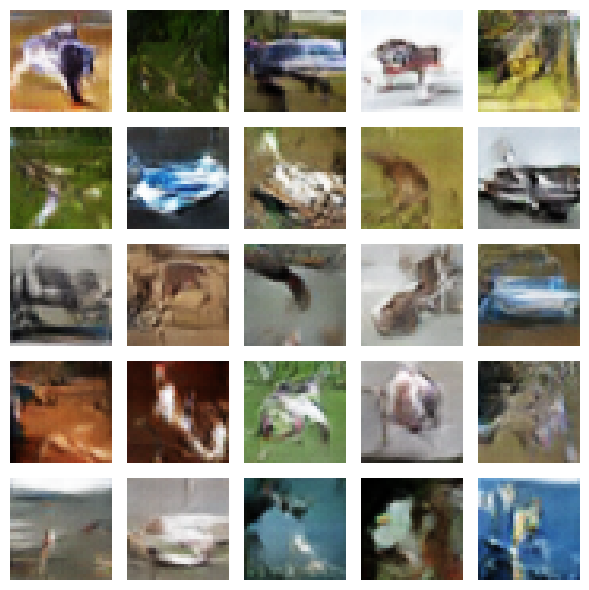

Época 81: Perda Discriminador = 0.6060, Perda Gerador = 1.5012
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


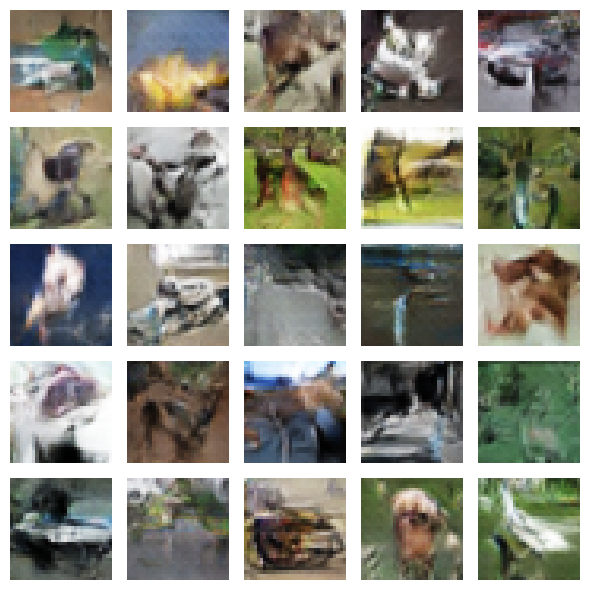

Época 82: Perda Discriminador = 0.6037, Perda Gerador = 1.5119
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


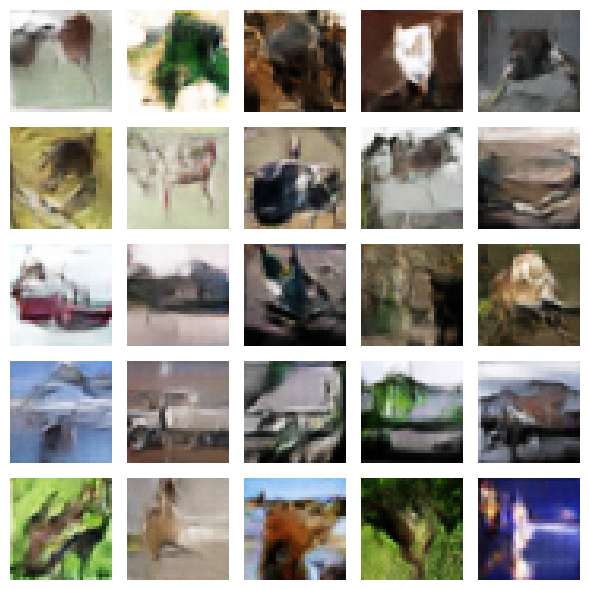

Época 83: Perda Discriminador = 0.6044, Perda Gerador = 1.5051
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


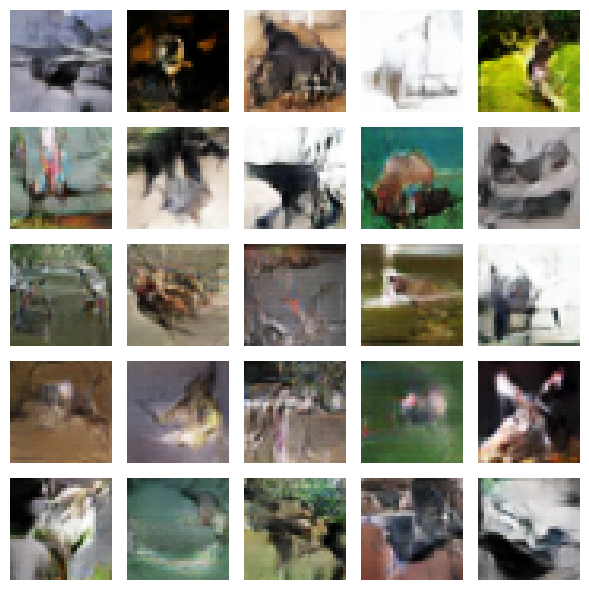

Época 84: Perda Discriminador = 0.6023, Perda Gerador = 1.5352
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


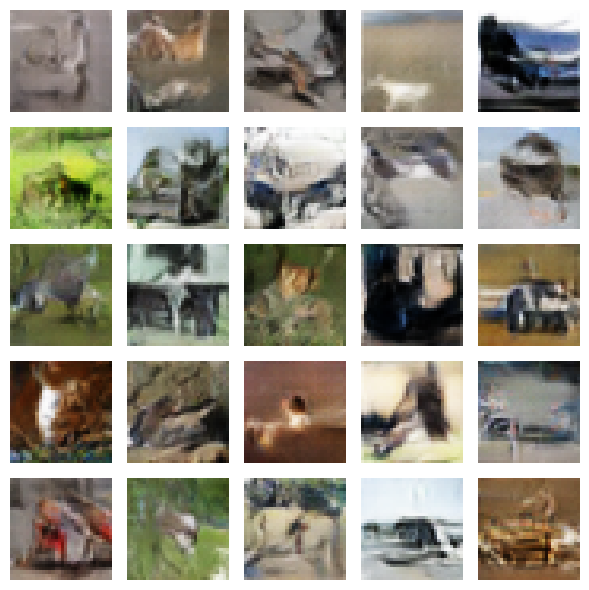

Época 85: Perda Discriminador = 0.6022, Perda Gerador = 1.5398
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


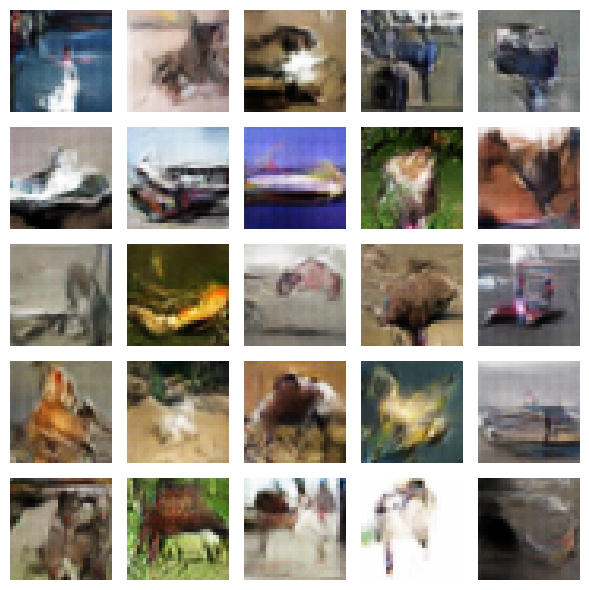

Época 86: Perda Discriminador = 0.5997, Perda Gerador = 1.5294
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


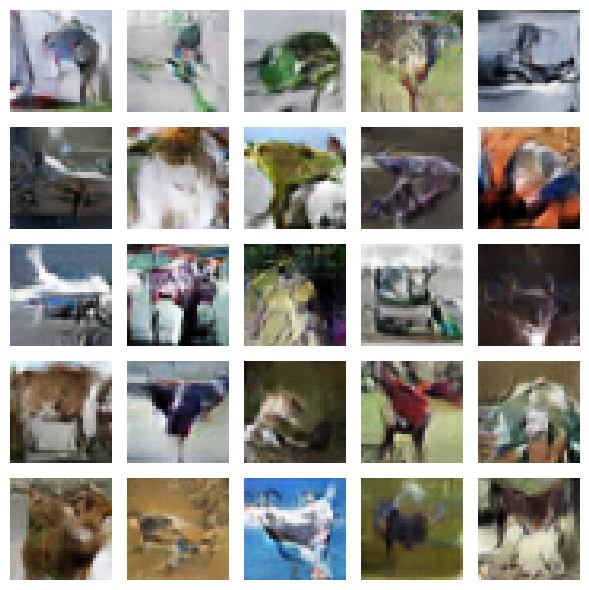

Época 87: Perda Discriminador = 0.5975, Perda Gerador = 1.5625
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


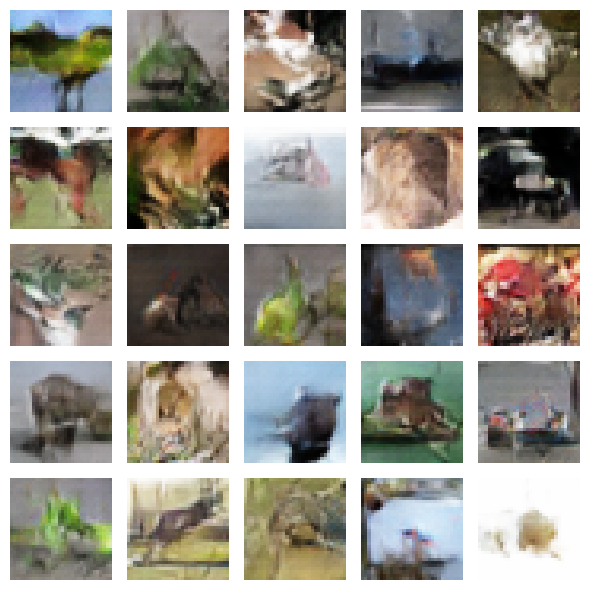

Época 88: Perda Discriminador = 0.5972, Perda Gerador = 1.5622
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


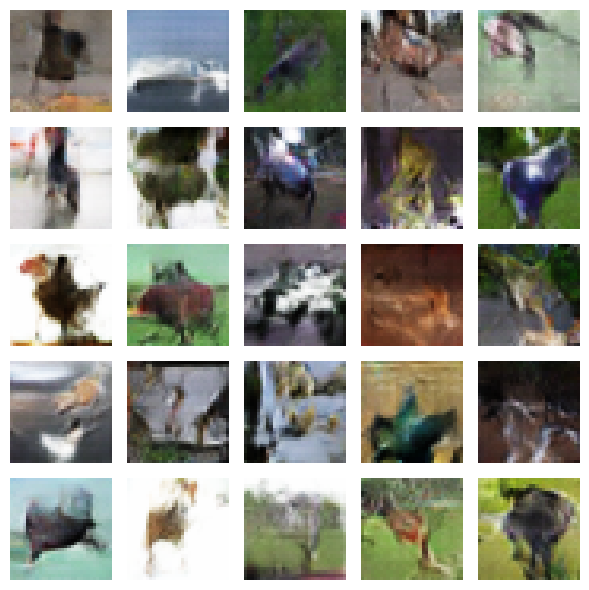

Época 89: Perda Discriminador = 0.5948, Perda Gerador = 1.5790
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


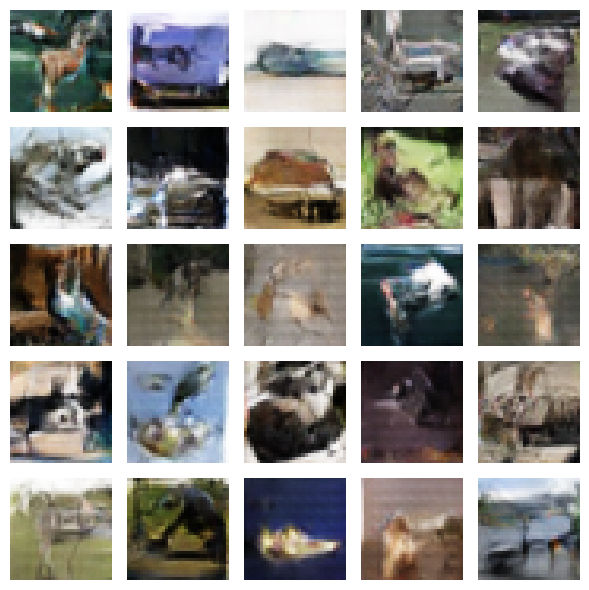

Época 90: Perda Discriminador = 0.5959, Perda Gerador = 1.5910
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


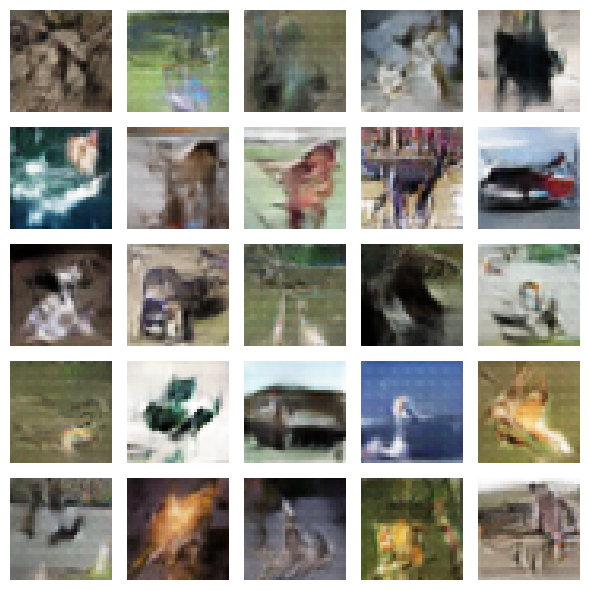

Época 91: Perda Discriminador = 0.5945, Perda Gerador = 1.6128
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


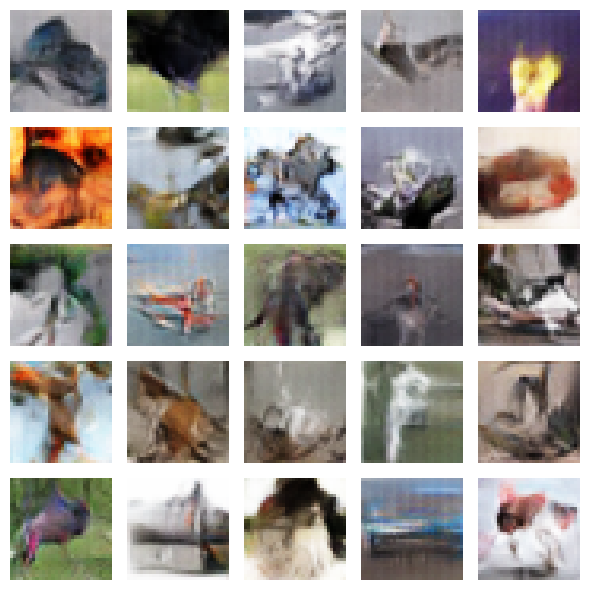

Época 92: Perda Discriminador = 0.5932, Perda Gerador = 1.6209
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


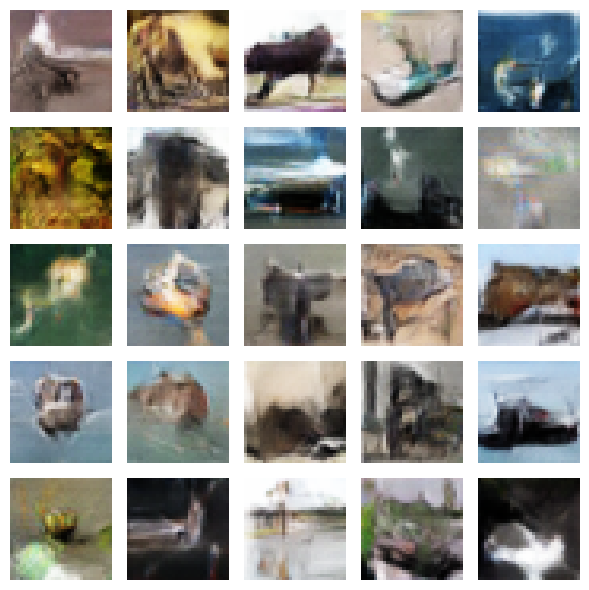

Época 93: Perda Discriminador = 0.5907, Perda Gerador = 1.6214
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


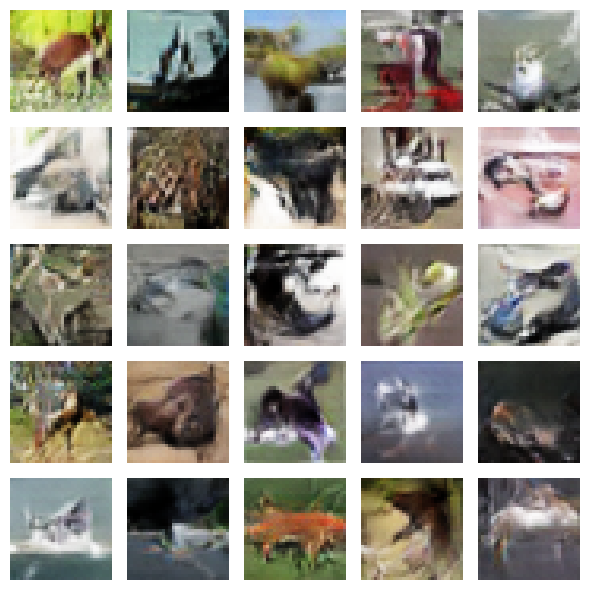

Época 94: Perda Discriminador = 0.5919, Perda Gerador = 1.6251
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


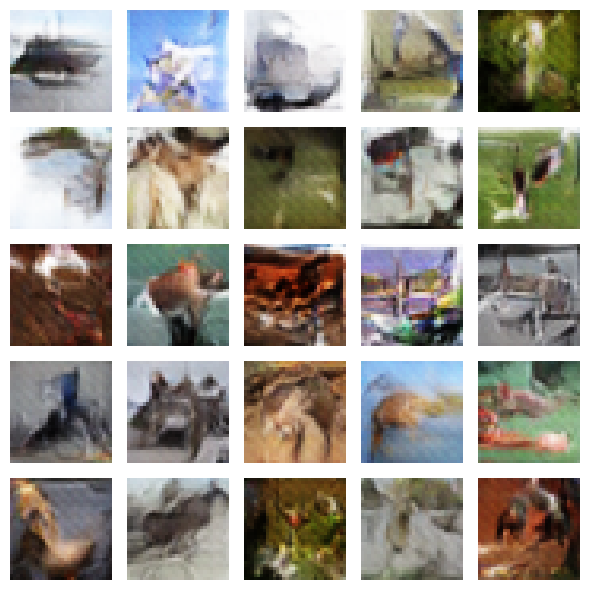

Época 95: Perda Discriminador = 0.5905, Perda Gerador = 1.6602
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


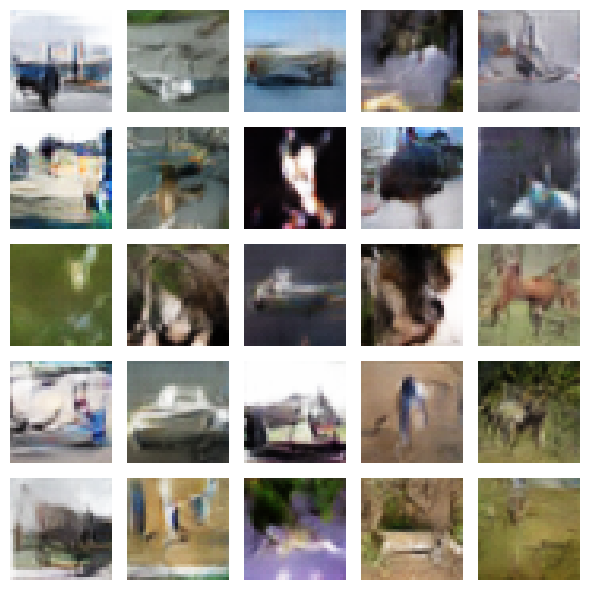

Época 96: Perda Discriminador = 0.5868, Perda Gerador = 1.6391
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


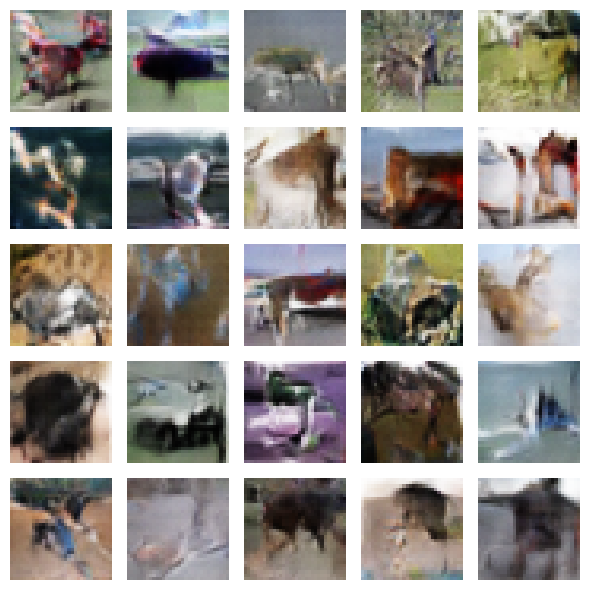

Época 97: Perda Discriminador = 0.5875, Perda Gerador = 1.6718
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


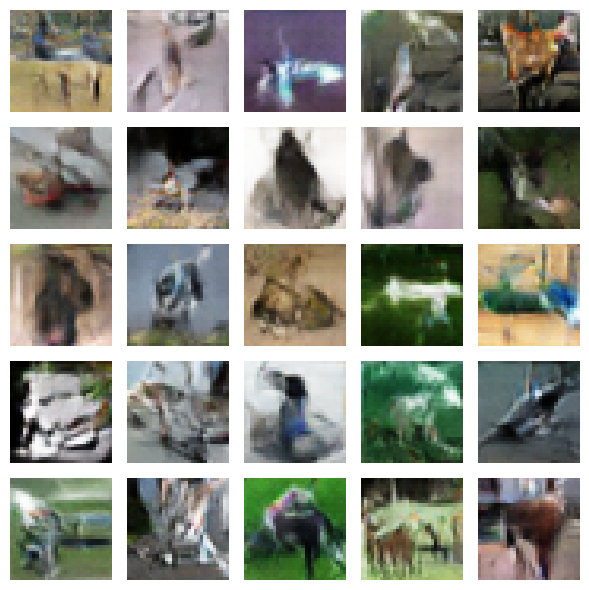

Época 98: Perda Discriminador = 0.5860, Perda Gerador = 1.6534
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


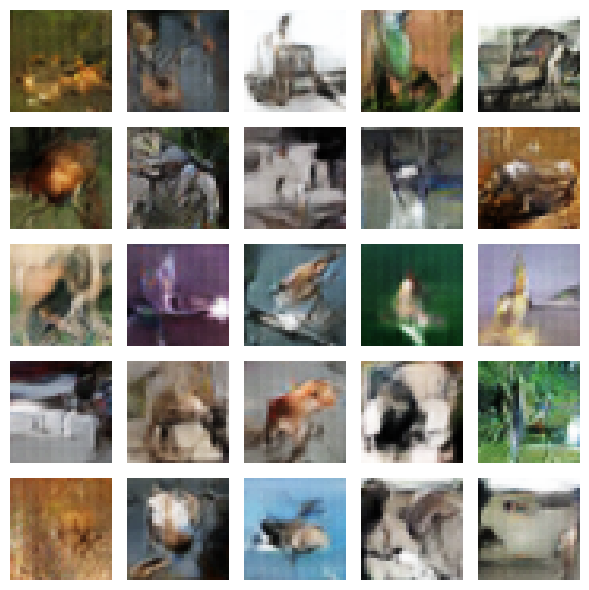

Época 99: Perda Discriminador = 0.5866, Perda Gerador = 1.6849
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


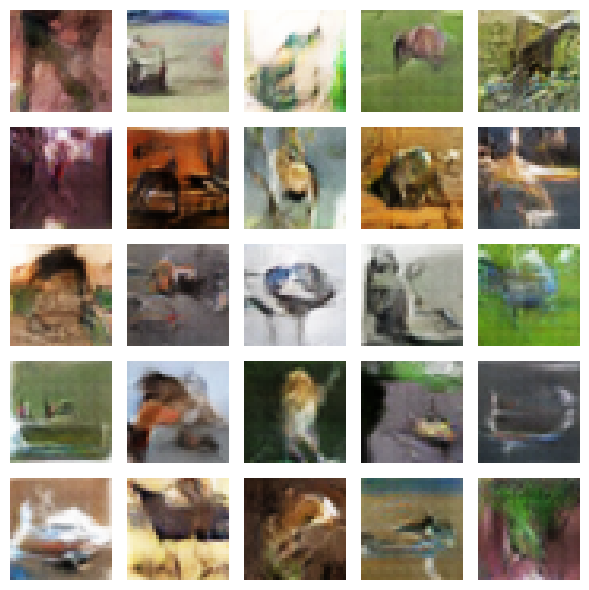

Época 100: Perda Discriminador = 0.5847, Perda Gerador = 1.6721
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


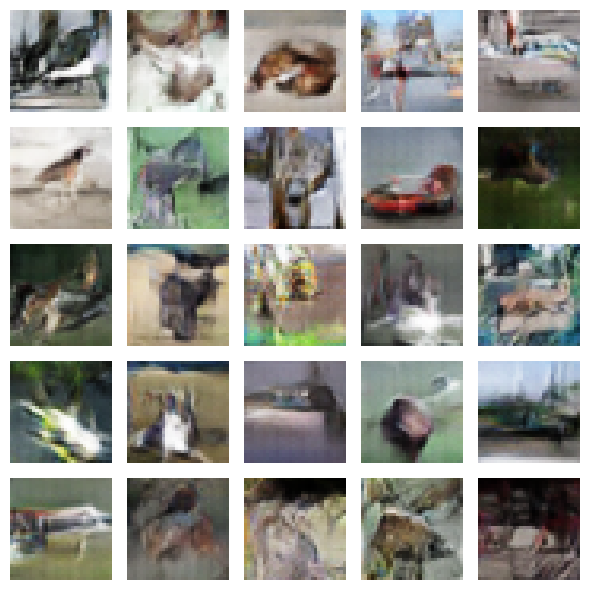

In [ ]:
# Treinar GAN
print('Iniciando o treinamento...')
perdas_discriminador, perdas_gerador = treinar_gan(gerador, discriminador, dados)

In [15]:
# carregar modelos salvos
gerador.load_weights(path + 'gerador_model_100.keras')
discriminador.load_weights(path + 'discriminador_model_100.keras')

In [16]:
# Carrega os resultados dos treinamentos (perdas)
perdas_discriminador = np.load(path + 'perdas_discriminador_100.npy', allow_pickle='TRUE')
perdas_gerador = np.load(path + 'perdas_gerador_100.npy', allow_pickle='TRUE')

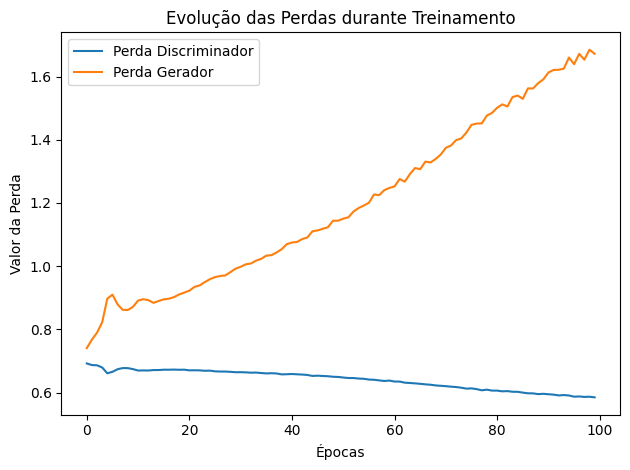

In [17]:
# Plotar resultados de treinamento (se possível)
try:
    plotar_perdas(perdas_discriminador, perdas_gerador)
except Exception as e:
    print(f"Erro ao plotar perdas: {e}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 506ms/step


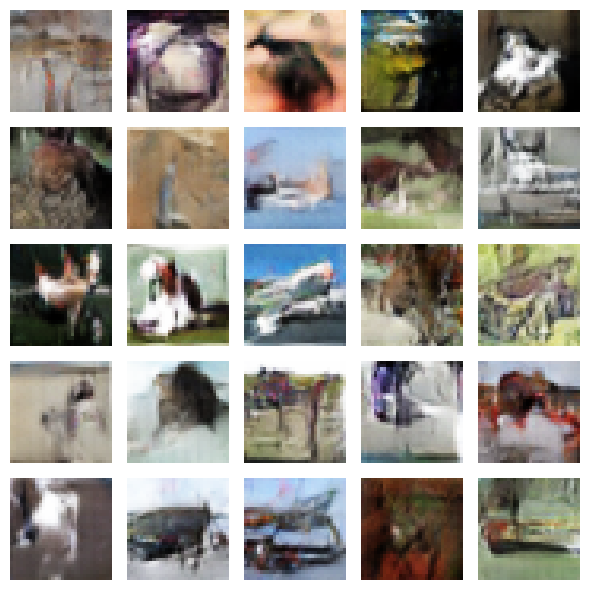

In [18]:
# Gerar algumas imagens finais
try:
    gerar_e_salvar_imagens(gerador, EPOCHS)
except Exception as e:
    print(f"Erro ao gerar imagens finais: {e}")

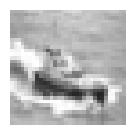

In [20]:
# plota uma imagem do banco de dados real
ix = random.randint(0,len(dados))
im = dados[ix]
im2 = 0.5*im+0.5
plt.figure(figsize=(1.5,1.5))
plt.imshow(im2)
plt.axis('off')
plt.show()

50 amostras de imagens geradas
média das predições do discriminador: 0.19797581


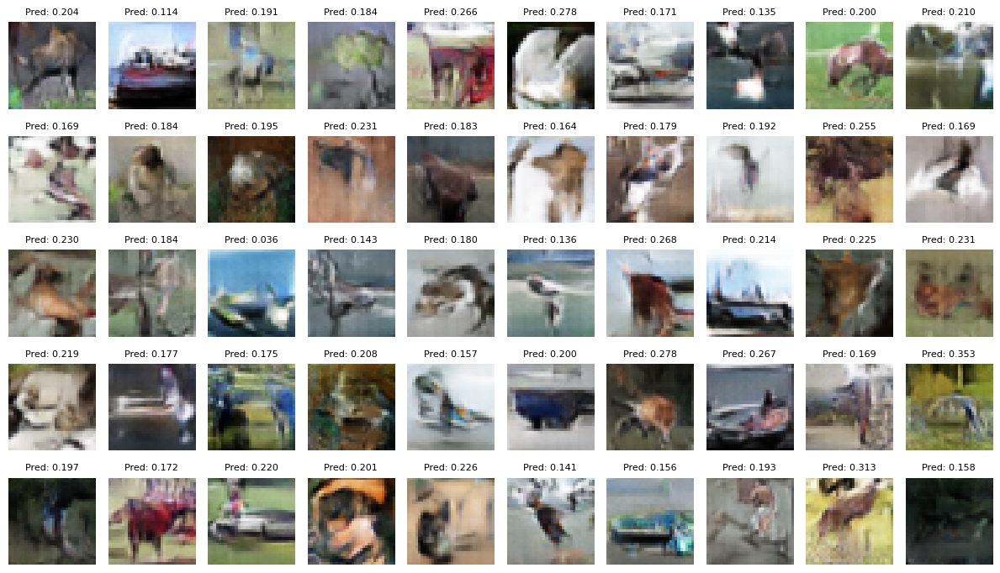

In [26]:
# Gera 50 imagens com o gerador e plota com as predições do discriminador.
print('50 amostras de imagens geradas')
# Gerar ruído para 50 imagens
ruido = tf.random.normal([50, LATENT_DIM])
# Gerar imagens
imagens_geradas = gerador.predict(ruido, verbose=False)
# Obter predições do discriminador
preditos = discriminador.predict(imagens_geradas, verbose=False)
print('média das predições do discriminador:', np.mean(preditos))
# Desnormalizar imagens para plotar --> range de [-1,1] para [0,1]
imagens_geradas = 0.5 * imagens_geradas + 0.5
# Plotar imagens
plt.figure(figsize=(12, 7))
for i in range(50):
    plt.subplot(5, 10, i+1)
    plt.imshow(imagens_geradas[i])
    # Formatar título com predição do discriminador
    plt.title(f'Pred: {preditos[i][0]:.3f}', fontsize=8)
    plt.axis('off')
# plt.tight_layout()
plt.show()

50 amostras de imagens reais
média das predições do discriminador: 0.34923008


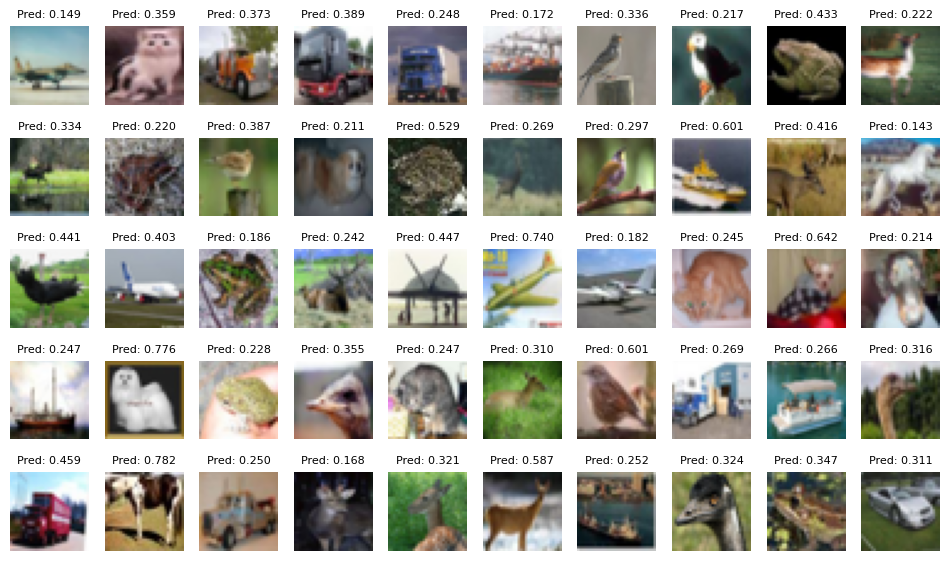

In [27]:
print('50 amostras de imagens reais')
ix = random.sample(range(len(dados)),50)
# 50 imagens reais aleatórias
imagens_reais = dados[ix]
# Obter predições do discriminador
preditos = discriminador.predict(imagens_reais, verbose=False)
print('média das predições do discriminador:', np.mean(preditos))
# Desnormalizar imagens
imagens_reais = 0.5 * imagens_reais + 0.5
# Plotar imagens
plt.figure(figsize=(12, 7))
for i in range(50):
    plt.subplot(5, 10, i+1)
    plt.imshow(imagens_reais[i])
    # Formatar título com predição do discriminador
    plt.title(f'Pred: {preditos[i][0]:.3f}', fontsize=8)
    plt.axis('off')
# plt.tight_layout()
plt.show()

##Referências

[1] [How to Develop a GAN to Generate CIFAR10](https://machinelearningmastery.com/how-to-develop-a-generative-adversarial-network-for-a-cifar-10-small-object-photographs-from-scratch/)

[2] https://www.tensorflow.org/tutorials/generative/dcgan

[3] https://pyimagesearch.com/2020/11/16/gans-with-keras-and-tensorflow/

[4] https://github.com/tensorflow/gan

[5] https://blog.paperspace.com/implementing-gans-in-tensorflow/

[6] https://pyimagesearch.com/2020/11/16/gans-with-keras-and-tensorflow/

##Exercícios
1. Analisar o gráfico das perdas ao longo do treinamento e comentar os resultados.
1. Change Latent Space. Update the example to use a larger or smaller latent space and compare the quality of the results and speed of training.
1. Batch Normalization. Update the discriminator and/or the generator to make use of batch normalization, recommended for DCGAN models.
1. Label Smoothing. Update the example to use one-sided label smoothing when training the discriminator, specifically change the target label of real examples from 1.0 to 0.9 and add random noise, then review the effects on image quality and speed of training.
1. Model Configuration. Update the model configuration to use deeper or more shallow discriminator and/or generator models, perhaps experiment with the UpSampling2D layers in the generator.
1. Modificar a estrutura da rede para deixá-la menos densa, retirandando algumas camadas do gerador e do discriminador. Verificar os resultados nos tempos de treinamento e na acurácia.
1. Compare the results and try to find the best architecture for the dataset used.
1. Modificar os hiperparâmetros para:
  - Latent Dimension: 150
  - Batch Size: 128
  - Epochs: 150
  - Learning Rate: 0.001
  - Beta_1 (Adam optimizer): 0.7
  - Rodar a rede e verificar, comparar e explicar os resultados.
1. Utilizar outros bancos de imagens como dataset e comparar os resultados.